# Hateful Memes Detection — Project Summary

---
## 1. Cài đặt & Load Dữ liệu



In [1]:
import json, sys, os, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from pathlib import Path
from sklearn.metrics import roc_curve, auc, roc_auc_score
from PIL import Image as PILImage
warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.dpi': 110, 'figure.facecolor': 'white',
    'axes.facecolor': '#fafafa', 'axes.spines.top': False, 'axes.spines.right': False,
    'axes.grid': True, 'grid.alpha': 0.22, 'grid.linestyle': '--',
    'axes.titlesize': 11, 'axes.labelsize': 10, 'font.size': 10,
    'legend.fontsize': 9, 'legend.framealpha': 0.85,
})

# Project root (1 cap len tu sumary/)
PROJECT_DIR = Path('..').resolve()

# FB (Plan A) paths — cau truc moi: nam trong 'Facebook Hateful Meme/'
DATA_DIR    = PROJECT_DIR / 'data'                                # FB raw data (van o root)
PRED_DIR    = PROJECT_DIR / 'Facebook Hateful Meme' / 'predictions'
TRAIN_DIR   = PROJECT_DIR / 'Facebook Hateful Meme' / 'train'
OUT_DIR     = Path('.').resolve()

def load_jsonl(p):  return [json.loads(l) for l in open(p, encoding='utf-8')]
def load_json(p):   return json.load(open(p, encoding='utf-8'))

def get_roc(preds, score_key='score'):
    labeled = [r for r in preds if r.get('label') is not None]
    y = np.array([r['label'] for r in labeled])
    s = np.array([r[score_key] if r.get(score_key) is not None else 0.5 for r in labeled])
    fpr, tpr, _ = roc_curve(y, s)
    return fpr, tpr, auc(fpr, tpr)

print(f'Project   : {PROJECT_DIR}')
print(f'FB data   : {DATA_DIR}')
print(f'FB preds  : {PRED_DIR}')
print(f'FB train  : {TRAIN_DIR}')


Project   : D:\CODE\DL\Hateful Meme Local
FB data   : D:\CODE\DL\Hateful Meme Local\data
FB preds  : D:\CODE\DL\Hateful Meme Local\Facebook Hateful Meme\predictions
FB train  : D:\CODE\DL\Hateful Meme Local\Facebook Hateful Meme\train


In [2]:
# ── FB (Plan A) — predictions, summaries, raw ─────────────────────────────────
preds_clip  = load_jsonl(PRED_DIR / 'predictions_clip.jsonl')
preds_blip  = load_jsonl(PRED_DIR / 'predictions_blip.jsonl')
preds_qwen  = load_jsonl(PRED_DIR / 'predictions_qwen2vl.jsonl')
preds_sig   = load_jsonl(PRED_DIR / 'predictions_siglip.jsonl')

sum_clip = load_json(PRED_DIR / 'summary_clip.json')
sum_blip = load_json(PRED_DIR / 'summary_blip.json')
sum_qwen = load_json(PRED_DIR / 'summary_qwen2vl.json')
sum_sig  = load_json(PRED_DIR / 'summary_siglip.json')

preds_v5_dev_path = PRED_DIR / 'predictions_v5_dev.jsonl'
preds_v5_dev = load_jsonl(preds_v5_dev_path) if preds_v5_dev_path.exists() else None
preds_v6_dev_path = PRED_DIR / 'predictions_v6_dev.jsonl'
preds_v6_dev = load_jsonl(preds_v6_dev_path) if preds_v6_dev_path.exists() else None
preds_v6_test_path = PRED_DIR / 'predictions_v6_test.jsonl'
preds_v6_test = load_jsonl(preds_v6_test_path) if preds_v6_test_path.exists() else None

preds_roberta_dev_path = PRED_DIR / 'predictions_roberta_dev.jsonl'
preds_roberta_dev = load_jsonl(preds_roberta_dev_path) if preds_roberta_dev_path.exists() else None
sum_roberta_path = PRED_DIR / 'summary_roberta.json'
sum_roberta = load_json(sum_roberta_path) if sum_roberta_path.exists() else None

preds_ensemble_dev_path = PRED_DIR / 'predictions_ensemble_dev.jsonl'
preds_ensemble_dev = load_jsonl(preds_ensemble_dev_path) if preds_ensemble_dev_path.exists() else None
sum_ensemble_path = PRED_DIR / 'summary_ensemble.json'
sum_ensemble = load_json(sum_ensemble_path) if sum_ensemble_path.exists() else None

sum_v6_path = PRED_DIR / 'summary_v6.json'
sum_v6 = load_json(sum_v6_path) if sum_v6_path.exists() else None

# Fine-tune training summaries (FB)
v1_sum = load_json(TRAIN_DIR / 'trained_model'                  / 'training_summary.json')
v2_sum = load_json(TRAIN_DIR / 'trained_model_v2_focal'         / 'training_summary.json')
v3_sum = load_json(TRAIN_DIR / 'trained_model_v3_head'          / 'training_summary.json')
v4_sum = load_json(TRAIN_DIR / 'trained_model_v4_pool'          / 'training_summary.json')
v5_sum = load_json(TRAIN_DIR / 'trained_model_v5_lora_expanded' / 'training_summary.json')
v6_sum = load_json(TRAIN_DIR / 'trained_model_v6_multiscale'    / 'training_summary.json')

# FB raw
train_data = load_jsonl(DATA_DIR / 'train.jsonl')
dev_data   = load_jsonl(DATA_DIR / 'dev.jsonl')
test_data  = load_jsonl(DATA_DIR / 'test.jsonl')

# ── Memotion 7K — raw ─────────────────────────────────────────────────────────
MEMOTION_DIR = PROJECT_DIR / 'memotion_dataset_7k'
mem_train = load_jsonl(MEMOTION_DIR / 'data' / 'train.jsonl')
mem_dev   = load_jsonl(MEMOTION_DIR / 'data' / 'dev.jsonl')
mem_test  = load_jsonl(MEMOTION_DIR / 'data' / 'test.jsonl')

# ── Merged (Plan B) — predictions, summaries, raw ─────────────────────────────
MERGED_PRED_DIR = PROJECT_DIR / 'Merged Hateful Meme' / 'predictions'
MERGED_DATA_DIR = PROJECT_DIR / 'merge_dataset' / 'data'

m_sum_blip = load_json(MERGED_PRED_DIR / 'summary_blip.json')
m_sum_clip = load_json(MERGED_PRED_DIR / 'summary_clip.json')
m_sum_qwen = load_json(MERGED_PRED_DIR / 'summary_qwen2vl.json')
m_sum_sig  = load_json(MERGED_PRED_DIR / 'summary_siglip.json')
m_sum_v6   = load_json(MERGED_PRED_DIR / 'summary_v6.json')

m_preds_blip    = load_jsonl(MERGED_PRED_DIR / 'predictions_blip.jsonl')
m_preds_clip    = load_jsonl(MERGED_PRED_DIR / 'predictions_clip.jsonl')
m_preds_qwen    = load_jsonl(MERGED_PRED_DIR / 'predictions_qwen2vl.jsonl')
m_preds_sig     = load_jsonl(MERGED_PRED_DIR / 'predictions_siglip.jsonl')
m_preds_v6_dev  = load_jsonl(MERGED_PRED_DIR / 'predictions_v6_dev.jsonl')
m_preds_v6_test = load_jsonl(MERGED_PRED_DIR / 'predictions_v6_test.jsonl')

# Merged v6 training summary
m_v6_train_path = PROJECT_DIR / 'Merged Hateful Meme' / 'train' / 'trained_model_v6_multiscale' / 'training_summary.json'
m_v6_sum = load_json(m_v6_train_path) if m_v6_train_path.exists() else None

m_train = load_jsonl(MERGED_DATA_DIR / 'train.jsonl')
m_dev   = load_jsonl(MERGED_DATA_DIR / 'dev.jsonl')
m_test  = load_jsonl(MERGED_DATA_DIR / 'test.jsonl')

MEM_ID_OFFSET = 1_000_000

print('=== FB Dataset ===')
print(f'  train={len(train_data):,} | dev={len(dev_data):,}')
print(f'  benchmark predictions: {len(preds_clip):,} per model')
print(f'  v6 dev TTA AUROC: {v6_sum.get("dev_auroc_tta","?")} | test TTA AUROC: {v6_sum.get("test_auroc_tta","?")}')
print()
print('=== Memotion 7K Dataset ===')
print(f'  train={len(mem_train):,} | dev={len(mem_dev):,} | test={len(mem_test):,} | total={len(mem_train)+len(mem_dev)+len(mem_test):,}')
print()
print('=== Merged Dataset (Plan B) ===')
print(f'  train={len(m_train):,} | dev={len(m_dev):,} | test={len(m_test):,}')
print(f'  v6 dev TTA AUROC: {m_sum_v6["dev_auroc_with_tta"]:.4f} | test TTA AUROC: {m_sum_v6["test_auroc_with_tta"]:.4f}')


=== FB Dataset ===
  train=8,500 | dev=500
  benchmark predictions: 500 per model
  v6 dev TTA AUROC: 0.85395 | test TTA AUROC: 0.76463

=== Memotion 7K Dataset ===
  train=5,593 | dev=699 | test=700 | total=6,992

=== Merged Dataset (Plan B) ===
  train=11,333 | dev=667 | test=1,333
  v6 dev TTA AUROC: 0.7840 | test TTA AUROC: 0.7490


---
## 2. EDA — Class Distribution (3 datasets)

Phân phối nhãn hateful/benign trên cả 3 dataset: FB, Memotion, Merged.


### 2.1 FB Hateful Memes Dataset


In [3]:
# Helper: unified EDA function — 3-panel bar chart + stats table
# Dung chung cho ca 3 dataset (FB / Memotion / Merged)

H_COLOR = '#e74c3c'  # hateful
B_COLOR = '#2ecc71'  # benign

def plot_eda(dataset_name, splits, save_path):
    """
    splits: list of (split_name, data_list)
    """
    n_splits = len(splits)
    fig, axes = plt.subplots(1, n_splits, figsize=(6 * n_splits, 6))
    if n_splits == 1:
        axes = [axes]

    for ax, (name, data) in zip(axes, splits):
        pos = sum(1 for r in data if r.get('label') == 1)
        neg = len(data) - pos
        bars = ax.bar(['Benign', 'Hateful'], [neg, pos],
                      color=[B_COLOR, H_COLOR], width=0.55,
                      edgecolor='black', linewidth=1.2)
        # Numbers + percentages on top of bars
        for b, v in zip(bars, [neg, pos]):
            pct = v / len(data) * 100
            ax.text(b.get_x() + b.get_width()/2, b.get_height() + max(neg, pos)*0.02,
                    f'{v:,}\n({pct:.1f}%)',
                    ha='center', va='bottom',
                    fontsize=11, fontweight='bold')
        ax.set_title(f'{name}.jsonl  (n={len(data):,})',
                     fontsize=13, fontweight='bold', pad=14)
        ax.set_ylabel('Sample count', fontsize=11)
        ax.set_ylim(0, max(neg, pos) * 1.20)
        ax.tick_params(axis='x', labelsize=11)

    fig.suptitle(f'{dataset_name} — Class Distribution',
                 fontsize=15, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(save_path, dpi=120, bbox_inches='tight')
    plt.show()


def print_stats_table(dataset_name, splits):
    """Print clean text table summary."""
    print(f'\n[ {dataset_name} — Summary ]')
    print('-' * 64)
    print(f'{"Split":8s} {"Total":>8s} {"Benign":>10s} {"Hateful":>12s} {"Hate %":>10s}')
    print('-' * 64)
    for name, data in splits:
        pos = sum(1 for r in data if r.get('label') == 1)
        neg = len(data) - pos
        pct = pos / len(data) * 100
        print(f'{name:8s} {len(data):>8,d} {neg:>10,d} {pos:>12,d} {pct:>9.2f}%')
    print('-' * 64)


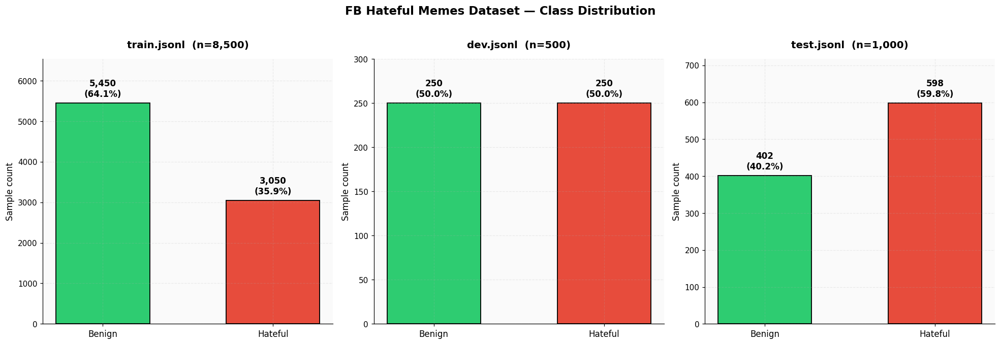


[ FB Hateful Memes — Summary ]
----------------------------------------------------------------
Split       Total     Benign      Hateful     Hate %
----------------------------------------------------------------
train       8,500      5,450        3,050     35.88%
dev           500        250          250     50.00%
test        1,000        402          598     59.80%
----------------------------------------------------------------


In [4]:
fb_splits = [('train', train_data), ('dev', dev_data), ('test', test_data)]
plot_eda('FB Hateful Memes Dataset', fb_splits, OUT_DIR / 'eda_fb.png')
print_stats_table('FB Hateful Memes', fb_splits)


### 2.2 Memotion 7K Dataset

Labels derived from `offensive` column (4-class) → binary: `hateful_offensive` ∨ `very_offensive` ⇒ label=1.


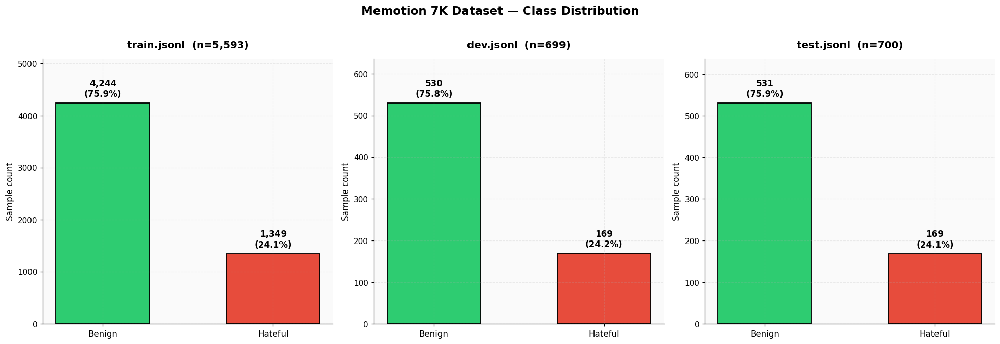


[ Memotion 7K — Summary ]
----------------------------------------------------------------
Split       Total     Benign      Hateful     Hate %
----------------------------------------------------------------
train       5,593      4,244        1,349     24.12%
dev           699        530          169     24.18%
test          700        531          169     24.14%
----------------------------------------------------------------

Note: Memotion labels derived from labels.csv `offensive` column:
  - very_offensive + hateful_offensive  -> label = 1
  - not_offensive + slight              -> label = 0


In [5]:
mem_splits = [('train', mem_train), ('dev', mem_dev), ('test', mem_test)]
plot_eda('Memotion 7K Dataset', mem_splits, OUT_DIR / 'eda_memotion.png')
print_stats_table('Memotion 7K', mem_splits)

print()
print('Note: Memotion labels derived from labels.csv `offensive` column:')
print('  - very_offensive + hateful_offensive  -> label = 1')
print('  - not_offensive + slight              -> label = 0')


### 2.3 Merged Dataset (FB + Memotion, 25% Memotion uniform)

Stacked bars phân biệt nguồn gốc (FB vs Memotion) trong từng class.


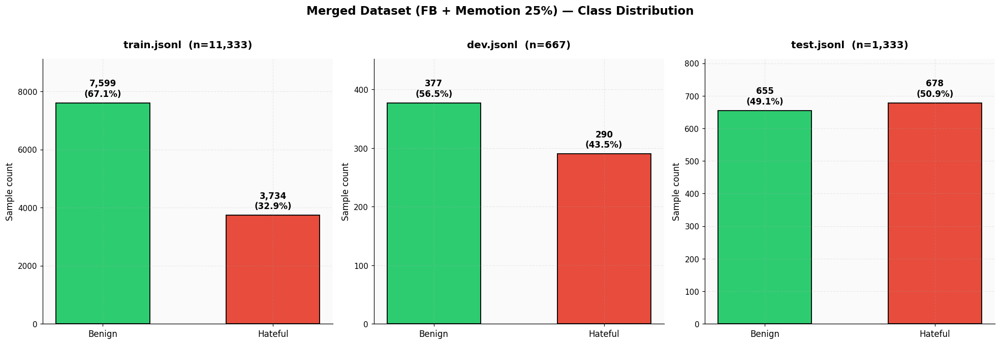


[ Merged (FB+Memotion) — Summary ]
----------------------------------------------------------------
Split       Total     Benign      Hateful     Hate %
----------------------------------------------------------------
train      11,333      7,599        3,734     32.95%
dev           667        377          290     43.48%
test        1,333        655          678     50.86%
----------------------------------------------------------------

[ Source Breakdown — FB vs Memotion contribution ]
----------------------------------------------------------------
Split       Total         FB     Memotion      Mem %
----------------------------------------------------------------
train      11,333      8,500        2,833     25.00%
dev           667        500          167     25.04%
test        1,333      1,000          333     24.98%
----------------------------------------------------------------


In [6]:
merged_splits = [('train', m_train), ('dev', m_dev), ('test', m_test)]
plot_eda('Merged Dataset (FB + Memotion 25%)', merged_splits, OUT_DIR / 'eda_merged.png')
print_stats_table('Merged (FB+Memotion)', merged_splits)

# Memotion proportion breakdown
print()
print('[ Source Breakdown — FB vs Memotion contribution ]')
print('-' * 64)
print(f'{"Split":8s} {"Total":>8s} {"FB":>10s} {"Memotion":>12s} {"Mem %":>10s}')
print('-' * 64)
for name, data in merged_splits:
    mem = sum(1 for r in data if r['id'] >= MEM_ID_OFFSET)
    fb_n = len(data) - mem
    pct = mem / len(data) * 100
    print(f'{name:8s} {len(data):>8,d} {fb_n:>10,d} {mem:>12,d} {pct:>9.2f}%')
print('-' * 64)


---
## 3. Phân tích Văn bản & Augmentation

So sánh độ dài text (word count) giữa 3 dataset và mô tả augmentation strategy.


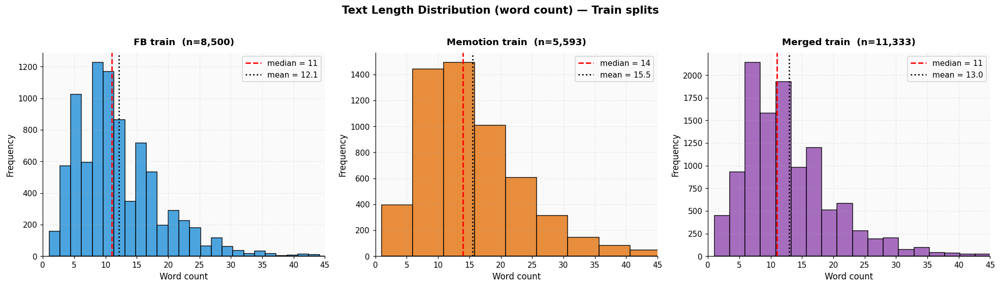


[ Text Statistics — word count per split ]
----------------------------------------------------------------------------
Dataset                      n    median      mean       p95     max
----------------------------------------------------------------------------
FB train                 8,500        11      12.1        25      70
FB dev                     500         9      10.5        22      42
FB test                  1,000        10      10.8        21      61
Memotion train           5,593        14      15.5        32     199
Memotion dev               699        14      15.9        33      81
Memotion test              700        14      15.7        31      64
Merged train            11,333        11      13.0        27      99
Merged dev                 667        10      11.9        26      62
Merged test              1,333        11      12.0        25      61
----------------------------------------------------------------------------


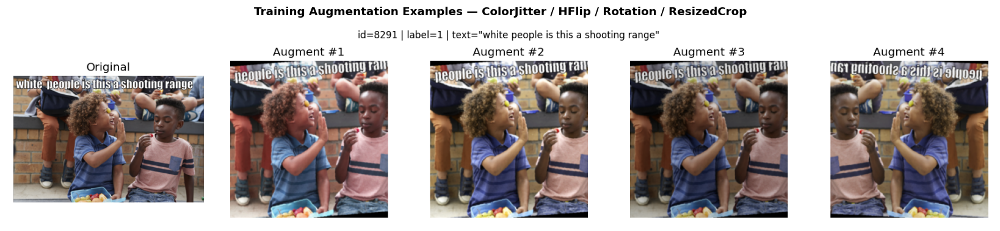


Augmentation strategy (training set only):
  ColorJitter         | brightness=0.2  contrast=0.2  saturation=0.1  hue=0.05
  RandomHorizontalFlip| p=0.3
  RandomRotation      | degrees=5
  RandomResizedCrop   | scale=(0.85, 1.0)  ratio=(0.9, 1.1)

TTA (test-time, v6): 4 views — identity / hflip / brightness x0.9 / brightness x1.1


In [7]:
import re

def word_count(text):
    return len(re.findall(r'\w+', text or ''))

# Text length histograms across 3 datasets (train only)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
configs = [
    ('FB train',       train_data, '#3498db'),
    ('Memotion train', mem_train,  '#e67e22'),
    ('Merged train',   m_train,    '#9b59b6'),
]
max_x = 0
for ax, (name, data, color) in zip(axes, configs):
    lens = [word_count(r.get('text', '')) for r in data]
    ax.hist(lens, bins=40, color=color, edgecolor='black', alpha=0.88)
    ax.axvline(np.median(lens), color='red', ls='--', lw=1.8, label=f'median = {np.median(lens):.0f}')
    ax.axvline(np.mean(lens), color='black', ls=':', lw=1.8, label=f'mean = {np.mean(lens):.1f}')
    ax.set_title(f'{name}  (n={len(data):,})', fontsize=12, fontweight='bold', pad=10)
    ax.set_xlabel('Word count', fontsize=11)
    ax.set_ylabel('Frequency', fontsize=11)
    ax.legend(fontsize=10, loc='upper right')
    max_x = max(max_x, np.percentile(lens, 99))
for ax in axes:
    ax.set_xlim(0, max_x)
fig.suptitle('Text Length Distribution (word count) — Train splits',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(OUT_DIR / 'eda_text_lengths.png', dpi=120, bbox_inches='tight')
plt.show()

# Clean text stats table
print()
print('[ Text Statistics — word count per split ]')
print('-' * 76)
print(f'{"Dataset":22s} {"n":>7s} {"median":>9s} {"mean":>9s} {"p95":>9s} {"max":>7s}')
print('-' * 76)
for name, data in [
    ('FB train',       train_data),
    ('FB dev',         dev_data),
    ('FB test',        test_data),
    ('Memotion train', mem_train),
    ('Memotion dev',   mem_dev),
    ('Memotion test',  mem_test),
    ('Merged train',   m_train),
    ('Merged dev',     m_dev),
    ('Merged test',    m_test),
]:
    lens = np.array([word_count(r.get('text','')) for r in data])
    print(f'{name:22s} {len(data):>7,d} {np.median(lens):>9.0f} {np.mean(lens):>9.1f} '
          f'{np.percentile(lens, 95):>9.0f} {lens.max():>7d}')
print('-' * 76)

# Augmentation demo
aug_path = PRED_DIR / 'augmentation_demo.png'
if aug_path.exists():
    fig, ax = plt.subplots(figsize=(15, 4))
    img = PILImage.open(aug_path)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title('Training Augmentation Examples — ColorJitter / HFlip / Rotation / ResizedCrop',
                 fontsize=12, fontweight='bold', pad=10)
    plt.tight_layout()
    plt.savefig(OUT_DIR / 'eda_augmentation.png', dpi=120, bbox_inches='tight')
    plt.show()

print()
print('Augmentation strategy (training set only):')
print('  ColorJitter         | brightness=0.2  contrast=0.2  saturation=0.1  hue=0.05')
print('  RandomHorizontalFlip| p=0.3')
print('  RandomRotation      | degrees=5')
print('  RandomResizedCrop   | scale=(0.85, 1.0)  ratio=(0.9, 1.1)')
print()
print('TTA (test-time, v6): 4 views — identity / hflip / brightness x0.9 / brightness x1.1')


---
## 4. FB Hateful Meme Dataset



### 4.1 Benchmark — 5 VLM Frozen (zero-shot)


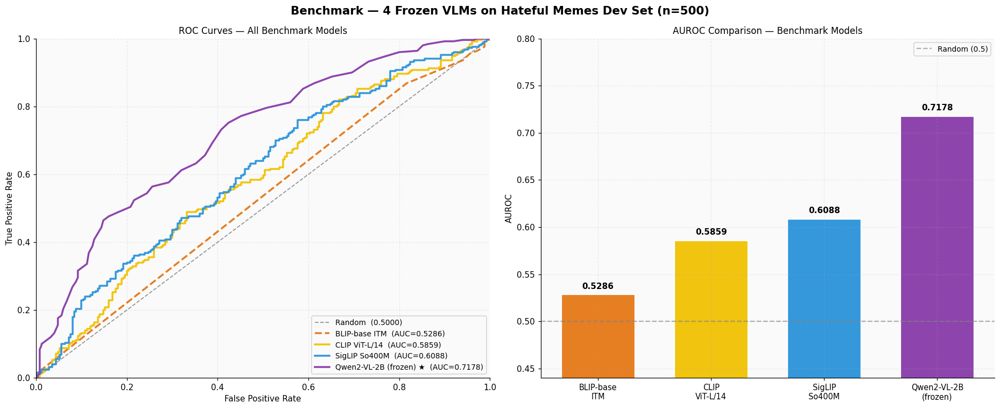

Figure 2 saved.


In [8]:
BENCH = [
    ('BLIP-base ITM',          preds_blip,  '#e67e22', '--'),
    ('CLIP ViT-L/14',          preds_clip,  '#f1c40f', '-'),
    ('SigLIP So400M',          preds_sig,   '#3498db', '-'),
    ('Qwen2-VL-2B (frozen) ★', preds_qwen,  '#8e44ad', '-'),
]

fig, axes = plt.subplots(1, 2, figsize=(17, 7))
fig.suptitle('Benchmark — 4 Frozen VLMs on Hateful Memes Dev Set (n=500)',
             fontsize=14, fontweight='bold')

ax_roc, ax_bar = axes

# ── ROC Curves ────────────────────────────────────────────────────────────────
ax_roc.plot([0,1],[0,1],'k--',lw=1.2, alpha=0.4, label='Random  (0.5000)')
for name, preds, color, ls in BENCH:
    fpr, tpr, auroc = get_roc(preds)
    ax_roc.plot(fpr, tpr, color=color, lw=2.3, ls=ls,
                label=f'{name}  (AUC={auroc:.4f})')
ax_roc.set_xlabel('False Positive Rate'); ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('ROC Curves — All Benchmark Models')
ax_roc.legend(loc='lower right')
ax_roc.set_xlim([0,1]); ax_roc.set_ylim([0,1])

# ── AUROC Bar Chart ───────────────────────────────────────────────────────────
bench_rows = [
    ('BLIP-base\nITM',         0.5286, '#e67e22'),
    ('CLIP\nViT-L/14',         0.5859, '#f1c40f'),
    ('SigLIP\nSo400M',         0.6088, '#3498db'),
    ('Qwen2-VL-2B\n(frozen)',  0.7178, '#8e44ad'),
]
names   = [r[0] for r in bench_rows]
aurocs  = [r[1] for r in bench_rows]
colors  = [r[2] for r in bench_rows]
bars = ax_bar.bar(range(len(bench_rows)), aurocs, color=colors,
                  edgecolor='white', linewidth=1.5, width=0.65)
ax_bar.set_xticks(range(len(bench_rows)))
ax_bar.set_xticklabels(names, fontsize=9.5)
ax_bar.axhline(0.5, color='gray', lw=1.5, ls='--', alpha=0.6, label='Random (0.5)')
for i, (bar, v) in enumerate(zip(bars, aurocs)):
    ax_bar.text(i, v + 0.006, f'{v:.4f}', ha='center', fontsize=10, fontweight='bold')
ax_bar.set_ylabel('AUROC')
ax_bar.set_title('AUROC Comparison — Benchmark Models')
ax_bar.set_ylim([0.44, 0.80])
ax_bar.legend()

plt.tight_layout()
plt.savefig(OUT_DIR / 'fig2_benchmark.png', dpi=120, bbox_inches='tight')
plt.show()
print('Figure 2 saved.')

### 4.2 Fine-tune Qwen2-VL — v1 → v6



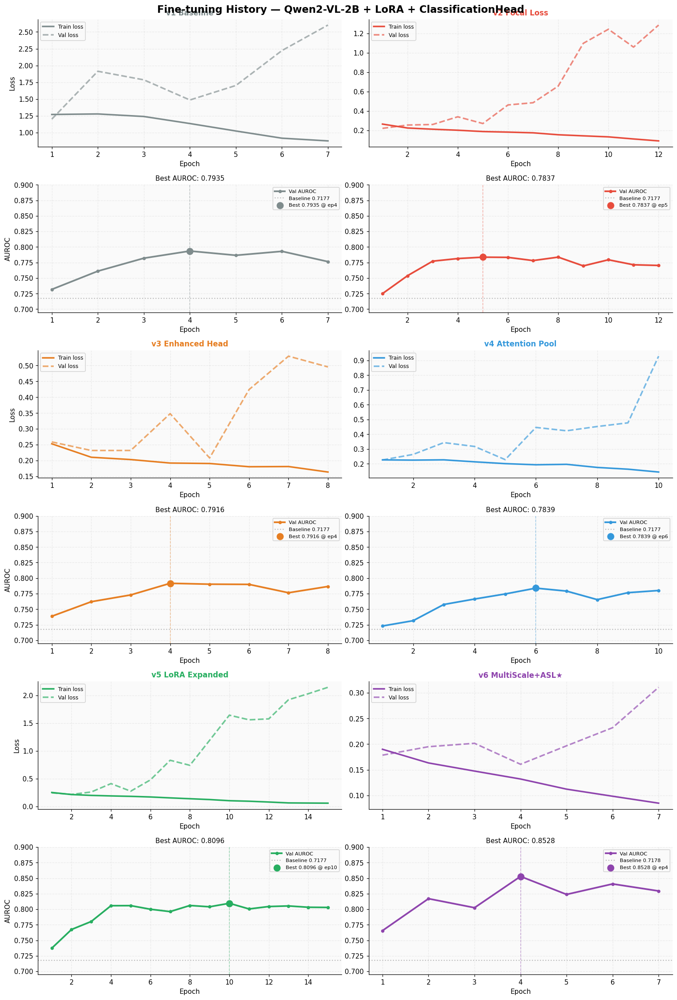

Figure 3 saved.


In [9]:
import math

MODEL_CFG = [
    ('v1 Baseline',          v1_sum, '#7f8c8d'),
    ('v2 Focal Loss',        v2_sum, '#e74c3c'),
    ('v3 Enhanced Head',     v3_sum, '#e67e22'),
    ('v4 Attention Pool',    v4_sum, '#3498db'),
    ('v5 LoRA Expanded',     v5_sum, '#27ae60'),
    ('v6 MultiScale+ASL★',   v6_sum, '#8e44ad'),
]

COLS  = 2
MROWS = (len(MODEL_CFG) + COLS - 1) // COLS   # = 3

fig, axes = plt.subplots(MROWS * 2, COLS, figsize=(14, MROWS * 7))
fig.suptitle('Fine-tuning History — Qwen2-VL-2B + LoRA + ClassificationHead',
             fontsize=15, fontweight='bold')

for i, (name, summary, color) in enumerate(MODEL_CFG):
    mrow = i // COLS
    col  = i % COLS
    # filter NaN-loss epochs (v6 epochs 13-15 corrupted by NaN)
    hist_all  = summary.get('history', [])
    hist = [h for h in hist_all if h.get('loss') == h.get('loss')]  # NaN != NaN
    if not hist: continue
    eps   = [h['epoch']      for h in hist]
    tl    = [h['train_loss'] for h in hist]
    vl    = [h['loss']       for h in hist]
    auroc = [h['auroc']      for h in hist]
    best_auroc = summary.get('best_auroc', max(auroc))
    best_ep    = next((h['epoch'] for h in hist if abs(h['auroc']-best_auroc)<0.0002), eps[-1])
    base_auroc = summary.get('baseline_auroc', 0.7178)

    ax_l = axes[mrow * 2, col]
    ax_l.plot(eps, tl, color=color, lw=2.3, label='Train loss')
    ax_l.plot(eps, vl, color=color, lw=2.3, ls='--', alpha=0.65, label='Val loss')
    ax_l.set_title(name, fontsize=11, fontweight='bold', color=color)
    ax_l.set_xlabel('Epoch')
    if col == 0: ax_l.set_ylabel('Loss')
    ax_l.legend(fontsize=8)

    ax_a = axes[mrow * 2 + 1, col]
    ax_a.plot(eps, auroc, color=color, lw=2.5, marker='o', markersize=4, label='Val AUROC')
    ax_a.axhline(base_auroc, color='#bbb', lw=1.5, ls=':', label=f'Baseline {base_auroc:.4f}')
    ax_a.scatter([best_ep], [best_auroc], color=color, s=90, zorder=5,
                 label=f'Best {best_auroc:.4f} @ ep{best_ep}')
    ax_a.axvline(best_ep, color=color, lw=1, ls='--', alpha=0.45)
    ax_a.set_xlabel('Epoch')
    if col == 0: ax_a.set_ylabel('AUROC')
    ax_a.set_title(f'Best AUROC: {best_auroc:.4f}', fontsize=10)
    ax_a.legend(fontsize=7.5)
    ax_a.set_ylim([0.695, 0.90])

plt.tight_layout()
plt.savefig(OUT_DIR / 'fig3_training.png', dpi=120, bbox_inches='tight')
plt.show()
print('Figure 3 saved.')

### 4.3 ROC Curves & AUROC Progression


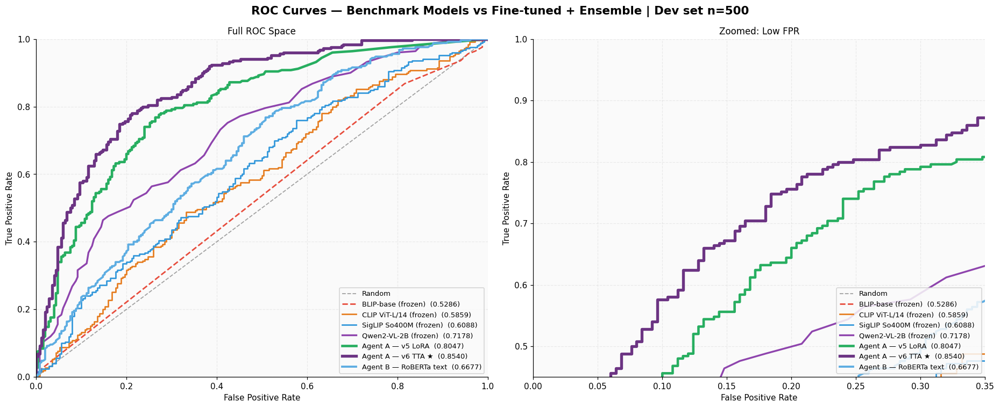

Figure 5 saved. (7 curves)


In [10]:
PLOT_CFGS = [
    ('BLIP-base (frozen)',     preds_blip,  'score',   '#e74c3c', '--', 1.8),
    ('CLIP ViT-L/14 (frozen)', preds_clip,  'score',   '#e67e22', '-',  1.8),
    ('SigLIP So400M (frozen)', preds_sig,   'score',   '#3498db', '-',  1.8),
    ('Qwen2-VL-2B (frozen)',   preds_qwen,  'score',   '#8e44ad', '-',  2.2),
]
if preds_v5_dev is not None:
    PLOT_CFGS.append(('Agent A — v5 LoRA', preds_v5_dev, 'score', '#27ae60', '-', 3.0))
if preds_v6_dev is not None:
    PLOT_CFGS.append(('Agent A — v6 TTA ★', preds_v6_dev, 'score', '#6c3483', '-', 3.5))
if preds_roberta_dev is not None:
    PLOT_CFGS.append(('Agent B — RoBERTa text', preds_roberta_dev, 'score', '#5dade2', '-', 2.5))
if preds_ensemble_dev is not None:
    PLOT_CFGS.append(('A+RoBERTa Ensemble', preds_ensemble_dev, 'score', '#117a65', '-', 3.0))

fig, (ax_full, ax_zoom) = plt.subplots(1, 2, figsize=(17, 7))
fig.suptitle('ROC Curves — Benchmark Models vs Fine-tuned + Ensemble | Dev set n=500',
             fontsize=14, fontweight='bold')

for ax, title, xlim, ylim in [
    (ax_full, 'Full ROC Space',    [0, 1],  [0, 1]),
    (ax_zoom, 'Zoomed: Low FPR',   [0, 0.35],[0.45, 1.0]),
]:
    ax.plot([0,1],[0,1],'k--',lw=1.2,alpha=0.35, label='Random')
    for name, preds, sk, color, ls, lw in PLOT_CFGS:
        fpr, tpr, auroc = get_roc(preds, sk)
        ax.plot(fpr, tpr, color=color, lw=lw, ls=ls, label=f'{name}  ({auroc:.4f})')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title)
    ax.legend(loc='lower right', fontsize=8.5)
    ax.set_xlim(xlim); ax.set_ylim(ylim)

plt.tight_layout()
plt.savefig(OUT_DIR / 'fig5_roc_comparison.png', dpi=120, bbox_inches='tight')
plt.show()
print(f'Figure 5 saved. ({len(PLOT_CFGS)} curves)')

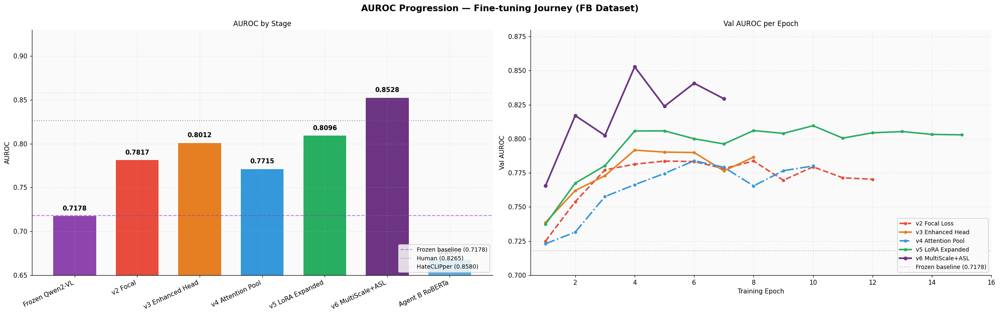

In [11]:
fig, (ax_stage, ax_ep) = plt.subplots(1, 2, figsize=(22, 7))
fig.suptitle('AUROC Progression — Fine-tuning Journey (FB Dataset)',
             fontsize=14, fontweight='bold')

# ── Stage bar chart (single-line labels, rotated) ─────────────────────────────
STAGES = [
    ('Frozen Qwen2-VL',   0.7178, '#8e44ad'),
    ('v2 Focal',          0.7817, '#e74c3c'),
    ('v3 Enhanced Head',  0.8012, '#e67e22'),
    ('v4 Attention Pool', 0.7715, '#3498db'),
    ('v5 LoRA Expanded',  0.8096, '#27ae60'),
    ('v6 MultiScale+ASL', 0.8528, '#6c3483'),
]
if sum_roberta is not None:
    STAGES.append(('Agent B RoBERTa', round(sum_roberta['auroc'], 4), '#5dade2'))
if sum_ensemble is not None:
    STAGES.append(('A+B Ensemble', round(sum_ensemble['auroc'], 4), '#117a65'))

xs = list(range(len(STAGES)))
bars = ax_stage.bar(xs, [s[1] for s in STAGES],
                    color=[s[2] for s in STAGES],
                    edgecolor='white', linewidth=1.4, width=0.7)
ax_stage.set_xticks(xs)
ax_stage.set_xticklabels([s[0] for s in STAGES], fontsize=10, rotation=25, ha='right')

# Value labels — push higher above bars
for i, s in enumerate(STAGES):
    ax_stage.text(i, s[1] + 0.006, f'{s[1]:.4f}',
                  ha='center', fontsize=10, fontweight='bold')

ax_stage.axhline(0.7178, color='#8e44ad', lw=1.4, ls='--', alpha=0.6, label='Frozen baseline (0.7178)')
ax_stage.axhline(0.8265, color='#666',    lw=1.4, ls=':',  alpha=0.6, label='Human (0.8265)')
ax_stage.axhline(0.8580, color='#aaa',    lw=1.0, ls=':',  alpha=0.4, label='HateCLIPper (0.8580)')
ax_stage.set_ylim([0.65, 0.93])
ax_stage.set_ylabel('AUROC')
ax_stage.set_title('AUROC by Stage')
ax_stage.legend(fontsize=9, loc='lower right')

# ── Per-epoch AUROC curves ────────────────────────────────────────────────────
EP_STYLE = [
    (v2_sum, 'v2 Focal Loss',    '#e74c3c', '--'),
    (v3_sum, 'v3 Enhanced Head', '#e67e22', '-'),
    (v4_sum, 'v4 Attention Pool','#3498db', '-.'),
    (v5_sum, 'v5 LoRA Expanded', '#27ae60', '-'),
]
for summary, name, color, ls in EP_STYLE:
    hist = summary.get('history', [])
    eps  = [h['epoch'] for h in hist]
    aur  = [h['auroc'] for h in hist]
    ax_ep.plot(eps, aur, color=color, lw=2.4, ls=ls, marker='o', markersize=4, label=name)

hist_v6 = v6_sum.get('history', [])
ax_ep.plot([h['epoch'] for h in hist_v6], [h['auroc'] for h in hist_v6],
           color='#6c3483', lw=2.6, ls='-', marker='o', markersize=5, label='v6 MultiScale+ASL')

ax_ep.axhline(0.7178, color='#aaa', lw=1.4, ls=':', alpha=0.7, label='Frozen baseline (0.7178)')
ax_ep.set_xlabel('Training Epoch'); ax_ep.set_ylabel('Val AUROC')
ax_ep.set_title('Val AUROC per Epoch')
ax_ep.legend(fontsize=9, loc='lower right')
ax_ep.set_ylim([0.70, 0.88])
ax_ep.set_xlim([0.5, 16])

plt.tight_layout()
plt.savefig(OUT_DIR / 'fig6_progression.png', dpi=120, bbox_inches='tight')
plt.show()


### 4.3.b AUROC Bar Chart — v1 -> v6 trên các split (train/dev/test)

Biểu đồ cột so sánh trực quan AUROC của 6 phiên bản fine-tune trên các split sẵn có (dev luôn có, train/test phụ thuộc training summary của từng version).

Extracted AUROC values per version (FB Hateful Memes):
  Version          Dev      Test
  ------------------------------
  v1               N/A       N/A
  v2               N/A       N/A
  v3               N/A       N/A
  v4               N/A       N/A
  v5               N/A       N/A
  v6            0.8539    0.7646


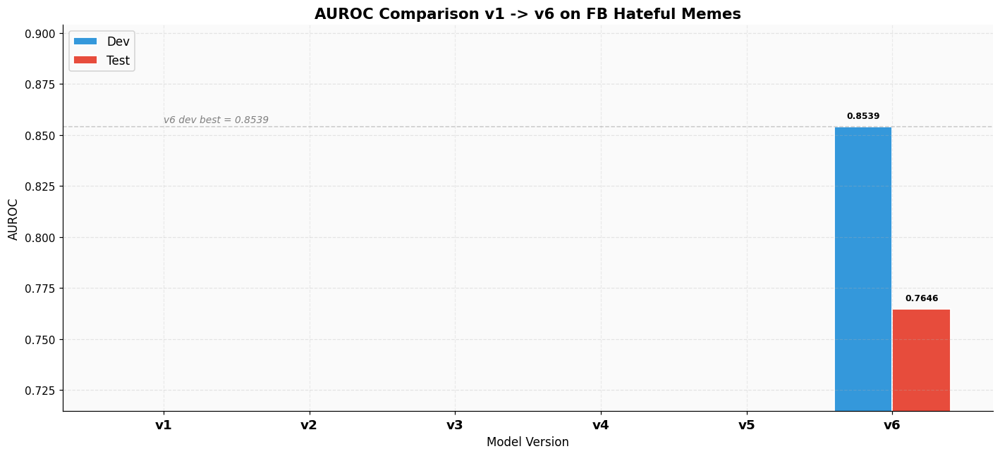


Saved -> fig_auroc_v1_v6_bars.png


In [12]:
def get_auroc(summary, split):
    """Try common field names for AUROC of a given split. Return float or None."""
    if summary is None:
        return None
    candidates = [
        f'{split}_auroc_tta',
        f'{split}_auroc_with_tta',
        f'best_epoch_{split}_auroc',
        f'best_{split}_auroc',
        f'final_{split}_auroc',
        f'{split}_auroc',
    ]
    for key in candidates:
        if key in summary and summary[key] is not None:
            return float(summary[key])
    return None

versions = ['v1', 'v2', 'v3', 'v4', 'v5', 'v6']
summaries = [v1_sum, v2_sum, v3_sum, v4_sum, v5_sum, v6_sum]

# Collect AUROC for each split
splits_data = {}
for split in ['train', 'dev', 'test']:
    values = [get_auroc(s, split) for s in summaries]
    if any(v is not None for v in values):
        splits_data[split] = values

print('Extracted AUROC values per version (FB Hateful Memes):')
header = f"  {'Version':<10}" + ''.join([f'{s.capitalize():>10}' for s in splits_data])
print(header)
print('  ' + '-' * (10 + 10 * len(splits_data)))
for i, v in enumerate(versions):
    row = f"  {v:<10}"
    for split in splits_data:
        val = splits_data[split][i]
        row += f'{val:>10.4f}' if val is not None else f"{'N/A':>10}"
    print(row)

# Plot grouped bar chart
n_models = len(versions)
n_splits = len(splits_data)
width = 0.8 / max(n_splits, 1)
x = np.arange(n_models)
colors = {'train': '#2ecc71', 'dev': '#3498db', 'test': '#e74c3c'}

fig, ax = plt.subplots(figsize=(13, 6))
for i, (split, values) in enumerate(splits_data.items()):
    offset = (i - (n_splits - 1) / 2) * width
    plot_values = [v if v is not None else 0 for v in values]
    bars = ax.bar(x + offset, plot_values, width,
                  label=split.capitalize(), color=colors.get(split, 'gray'),
                  edgecolor='white', linewidth=1.2)
    for bar, val in zip(bars, values):
        if val is not None and val > 0:
            ax.text(bar.get_x() + bar.get_width()/2,
                    bar.get_height() + 0.003,
                    f'{val:.4f}',
                    ha='center', va='bottom',
                    fontsize=8, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels(versions, fontsize=12, fontweight='bold')
ax.set_xlabel('Model Version', fontsize=11)
ax.set_ylabel('AUROC', fontsize=11)
ax.set_title('AUROC Comparison v1 -> v6 on FB Hateful Memes', fontsize=14, fontweight='bold')

# Set y-axis range with buffer
all_vals = [v for split_vals in splits_data.values() for v in split_vals if v is not None]
y_min = max(0.5, min(all_vals) - 0.05) if all_vals else 0.5
y_max = min(1.0, max(all_vals) + 0.05) if all_vals else 1.0
ax.set_ylim(y_min, y_max)
ax.legend(loc='upper left', fontsize=11)
ax.grid(axis='y', alpha=0.3)

# Highlight v6 best with horizontal dashed line
v6_dev = get_auroc(v6_sum, 'dev')
if v6_dev:
    ax.axhline(y=v6_dev, linestyle='--', color='gray', alpha=0.4, linewidth=1)
    ax.text(0.0, v6_dev + 0.002, f'v6 dev best = {v6_dev:.4f}',
            fontsize=9, color='gray', style='italic')

plt.tight_layout()
out_path = OUT_DIR / 'fig_auroc_v1_v6_bars.png'
plt.savefig(out_path, dpi=120, bbox_inches='tight')
plt.show()
print(f'\nSaved -> {out_path.name}')

### 4.4 So sánh Tổng thể — Tất cả Model

Bar chart AUROC toàn bộ model (frozen + fine-tuned + ensemble) so với human baseline.


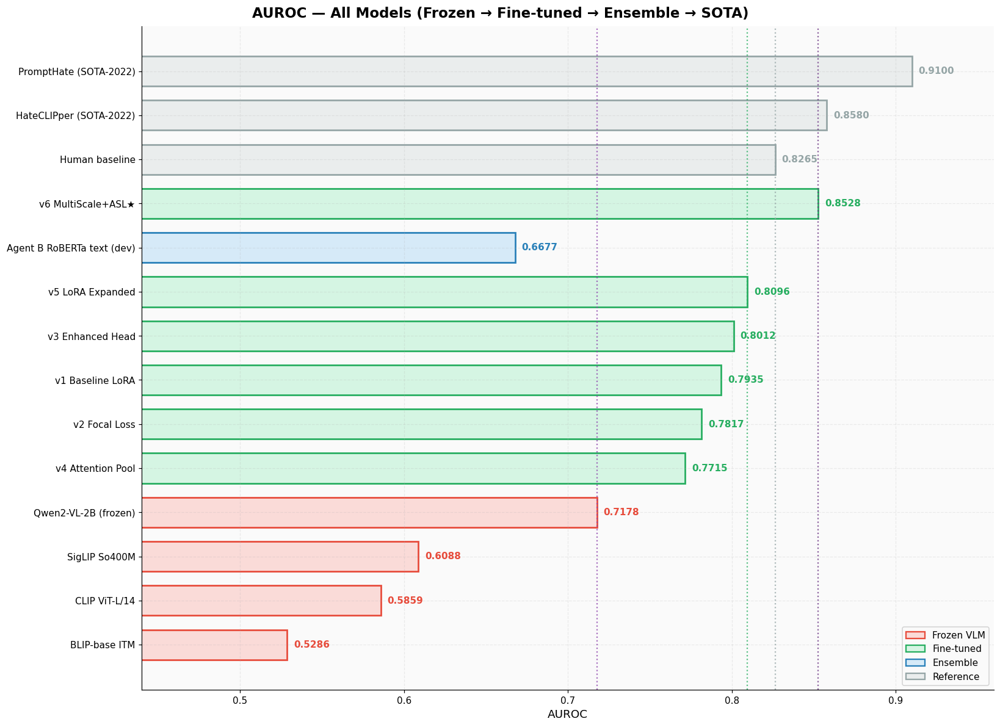

Figure 4 saved. (14 models)


In [13]:
ALL_MODELS = [
    # (label, auroc, color, category)
    ('BLIP-base ITM',              0.5286, '#e74c3c', 'Frozen VLM'),
    ('CLIP ViT-L/14',              0.5859, '#e67e22', 'Frozen VLM'),
    ('SigLIP So400M',              0.6088, '#f39c12', 'Frozen VLM'),
    ('Qwen2-VL-2B (frozen)',       0.7178, '#8e44ad', 'Frozen VLM'),
    ('v4 Attention Pool',          0.7715, '#aed6f1', 'Fine-tuned'),
    ('v2 Focal Loss',              0.7817, '#5dade2', 'Fine-tuned'),
    ('v1 Baseline LoRA',           0.7935, '#2980b9', 'Fine-tuned'),
    ('v3 Enhanced Head',           0.8012, '#1a5276', 'Fine-tuned'),
    ('v5 LoRA Expanded',           0.8096, '#1e8449', 'Fine-tuned'),
    ('v6 MultiScale+ASL★',        0.8528, '#6c3483', 'Fine-tuned'),
    ('Human baseline',             0.8265, '#aab7b8', 'Reference'),
    ('HateCLIPper (SOTA-2022)',    0.8580, '#7f8c8d', 'Reference'),
    ('PromptHate (SOTA-2022)',     0.9100, '#566573', 'Reference'),
]

# Thêm Plan A nếu đã chạy
if sum_roberta is not None:
    ALL_MODELS.insert(9, ('Agent B RoBERTa text (dev)', round(sum_roberta['auroc'], 4),
                           '#5dade2', 'Ensemble'))
if sum_ensemble is not None:
    ALL_MODELS.insert(10 if sum_roberta is not None else 9,
                      ('A+RoBERTa Ensemble (dev)', round(sum_ensemble['auroc'], 4),
                       '#117a65', 'Ensemble'))

TYPE_FILL  = {'Frozen VLM':'#fadbd8','Fine-tuned':'#d5f5e3','Ensemble':'#d6eaf8','Reference':'#eaeded'}
TYPE_EDGE  = {'Frozen VLM':'#e74c3c','Fine-tuned':'#27ae60','Ensemble':'#2980b9','Reference':'#95a5a6'}

fig, ax = plt.subplots(figsize=(15, 11))
fig.suptitle('AUROC — All Models (Frozen → Fine-tuned → Ensemble → SOTA)',
             fontsize=15, fontweight='bold')

y = range(len(ALL_MODELS))
bars = ax.barh(list(y), [m[1] for m in ALL_MODELS],
               color=[TYPE_FILL[m[3]] for m in ALL_MODELS],
               edgecolor=[TYPE_EDGE[m[3]] for m in ALL_MODELS],
               linewidth=1.8, height=0.68)

ax.set_yticks(list(y))
ax.set_yticklabels([m[0] for m in ALL_MODELS], fontsize=10)

for i, (bar, m) in enumerate(zip(bars, ALL_MODELS)):
    ax.text(m[1] + 0.004, i, f'{m[1]:.4f}', va='center', fontsize=10,
            fontweight='bold', color=TYPE_EDGE[m[3]])

ax.axvline(0.7178, color='#8e44ad', lw=1.5, ls=':', alpha=0.75, label='Frozen Qwen2-VL (0.7178)')
ax.axvline(0.8096, color='#27ae60', lw=1.5, ls=':', alpha=0.75, label='Fine-tuned v5 (0.8096)')
ax.axvline(0.8265, color='#95a5a6', lw=1.5, ls=':', alpha=0.75, label='Human (0.8265)')
ax.axvline(0.8528, color='#6c3483', lw=1.5, ls=':', alpha=0.75, label='Fine-tuned v6 ★ (0.8528)')

patches = [mpatches.Patch(facecolor=TYPE_FILL[t], edgecolor=TYPE_EDGE[t],
                          linewidth=1.5, label=t)
           for t in ['Frozen VLM', 'Fine-tuned', 'Ensemble', 'Reference']]
ax.legend(handles=patches, loc='lower right', fontsize=10)

ax.set_xlabel('AUROC', fontsize=12)
ax.set_xlim([0.44, 0.96])

plt.tight_layout()
plt.savefig(OUT_DIR / 'fig4_all_auroc.png', dpi=120, bbox_inches='tight')
plt.show()
print(f'Figure 4 saved. ({len(ALL_MODELS)} models)')

### 4.5 Test Set Inferences Visualization — v6 (15 samples)

9 hateful + 6 benign từ FB test set (test.jsonl có labels manual-annotated), predict bằng v6 MultiScale+TTA.
Border xanh = predict đúng, đỏ = sai.


Labeled: 1000  (hateful=598  benign=402)


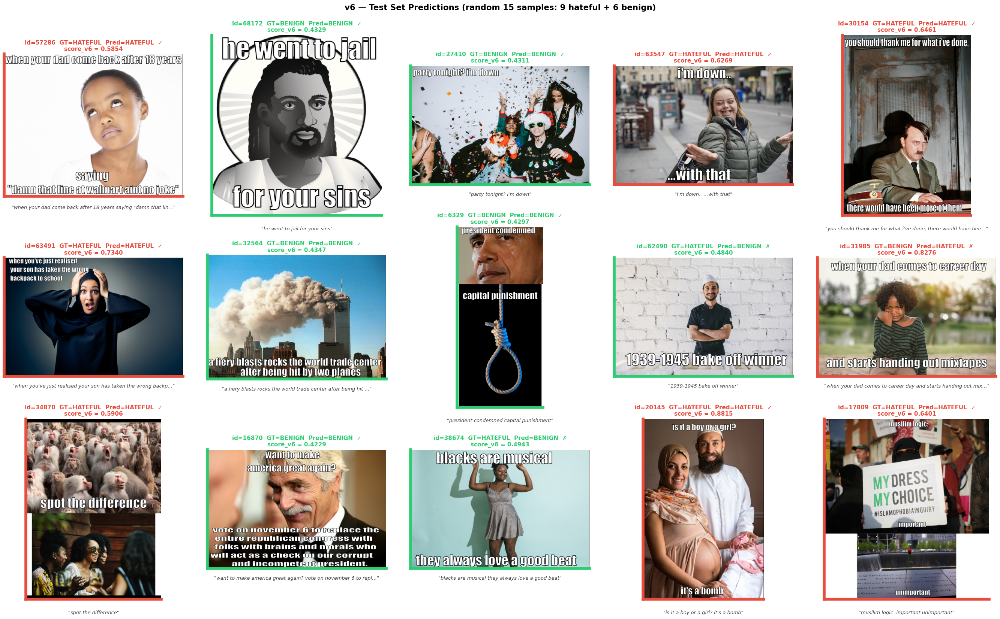

Figure 7 — v6 test predictions saved -> D:\CODE\DL\Hateful Meme Local\sumary\fig7_test_predictions.png


In [14]:
import random as _random
from matplotlib.patches import Rectangle

# ── Load v6 test predictions + join with test.jsonl ──────────────────────────
preds_v6_test_path = PRED_DIR / 'predictions_v6_test.jsonl'
test_jsonl_path    = DATA_DIR / 'test.jsonl'

if not (preds_v6_test_path.exists() and test_jsonl_path.exists()):
    print('[!] Missing v6 test predictions or test.jsonl')
else:
    preds_v6_test = load_jsonl(preds_v6_test_path)
    test_records  = load_jsonl(test_jsonl_path)
    rec_by_id     = {r['id']: r for r in test_records}

    # Join score + image_path + text by id
    joined = []
    for p in preds_v6_test:
        rec = rec_by_id.get(p['id'])
        if rec is None: continue
        joined.append({
            'id':    p['id'],
            'score': p['score'],
            'logit': p.get('logit'),
            'label': p.get('label', rec.get('label')),
            'img':   rec.get('img'),
            'text':  rec.get('text', ''),
        })

    # Filter only labeled samples (598 hateful + 402 benign)
    labeled = [j for j in joined if j['label'] is not None]
    hateful = [j for j in labeled if j['label'] == 1]
    benign  = [j for j in labeled if j['label'] == 0]
    print(f'Labeled: {len(labeled)}  (hateful={len(hateful)}  benign={len(benign)})')

    # Random sample: 9 hateful + 6 benign = 15 total (matches test 60/40 ratio)
    _random.seed()  # different each run
    sample_h = _random.sample(hateful, min(9, len(hateful)))
    sample_b = _random.sample(benign,  min(6, len(benign)))
    samples  = sample_h + sample_b
    _random.shuffle(samples)

    # ── Render 3x5 grid ────────────────────────────────────────────────────────
    NROWS, NCOLS = 3, 5
    fig, axes = plt.subplots(NROWS, NCOLS, figsize=(NCOLS * 5, NROWS * 5))
    fig.suptitle('v6 — Test Set Predictions (random 15 samples: 9 hateful + 6 benign)',
                 fontsize=14, fontweight='bold', y=0.995)

    HCOL_PRED = '#e74c3c'   # red = predicted hateful
    BCOL_PRED = '#2ecc71'   # green = predicted benign

    for ax, s in zip(axes.flat, samples):
        img_path = DATA_DIR / s['img']
        if not img_path.exists():
            img_path = DATA_DIR / 'img' / Path(s['img']).name
        if img_path.exists():
            img = PILImage.open(img_path).convert('RGB')
            ax.imshow(img)
        ax.set_xticks([]); ax.set_yticks([])

        pred_hateful = s['score'] >= 0.5
        border_color = HCOL_PRED if pred_hateful else BCOL_PRED
        for spine in ax.spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(5)

        gt_label = 'HATEFUL' if s['label'] == 1 else 'BENIGN'
        pred_label = 'HATEFUL' if pred_hateful else 'BENIGN'
        correct = '✓' if (s['label'] == 1) == pred_hateful else '✗'
        title = (f'id={s["id"]}  GT={gt_label}  Pred={pred_label}  {correct}\n'
                 f'score_v6 = {s["score"]:.4f}')
        ax.set_title(title, fontsize=10, color=border_color, fontweight='bold', pad=6)

        text_snippet = (s['text'][:60] + '…') if len(s['text']) > 60 else s['text']
        ax.text(0.5, -0.06, f'"{text_snippet}"', transform=ax.transAxes,
                ha='center', va='top', fontsize=8.5, color='#444', style='italic')

    plt.tight_layout()
    out_path = OUT_DIR / 'fig7_test_predictions.png'
    plt.savefig(out_path, dpi=110, bbox_inches='tight')
    plt.show()
    print(f'Figure 7 — v6 test predictions saved -> {out_path}')

---
## 5. Merged Hateful Meme Dataset



### 5.1 Benchmark — 4 VLM Frozen trên Merged


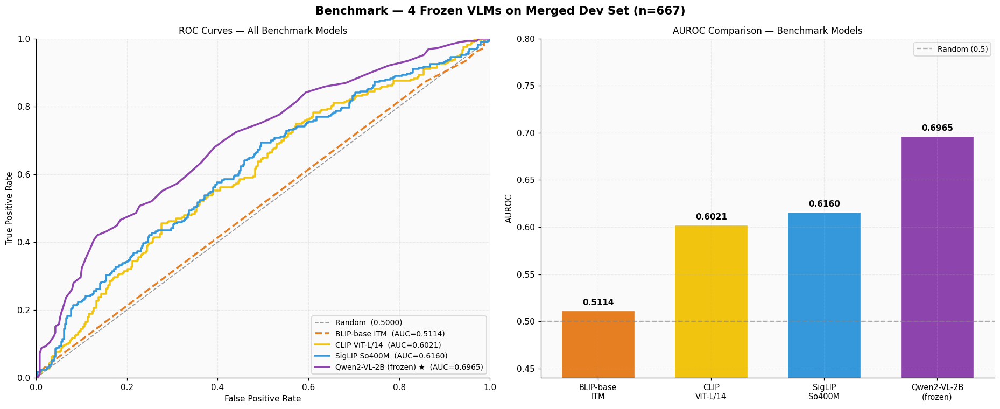

In [15]:
BENCH_M = [
    ('BLIP-base ITM',          m_preds_blip, '#e67e22', '--'),
    ('CLIP ViT-L/14',          m_preds_clip, '#f1c40f', '-'),
    ('SigLIP So400M',          m_preds_sig,  '#3498db', '-'),
    ('Qwen2-VL-2B (frozen) ★', m_preds_qwen, '#8e44ad', '-'),
]

fig, axes = plt.subplots(1, 2, figsize=(17, 7))
fig.suptitle('Benchmark — 4 Frozen VLMs on Merged Dev Set (n={})'.format(len(m_dev)),
             fontsize=14, fontweight='bold')

ax_roc, ax_bar = axes
# ROC
ax_roc.plot([0,1],[0,1],'k--',lw=1.2, alpha=0.4, label='Random  (0.5000)')
for name, preds, color, ls in BENCH_M:
    fpr, tpr, auroc = get_roc(preds)
    ax_roc.plot(fpr, tpr, color=color, lw=2.3, ls=ls, label=f'{name}  (AUC={auroc:.4f})')
ax_roc.set_xlabel('False Positive Rate'); ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('ROC Curves — All Benchmark Models')
ax_roc.legend(loc='lower right')
ax_roc.set_xlim([0,1]); ax_roc.set_ylim([0,1])

# AUROC bar
m_bench_rows = [
    ('BLIP-base\nITM',        m_sum_blip['auroc'], '#e67e22'),
    ('CLIP\nViT-L/14',        m_sum_clip['auroc'], '#f1c40f'),
    ('SigLIP\nSo400M',        m_sum_sig['auroc'],  '#3498db'),
    ('Qwen2-VL-2B\n(frozen)', m_sum_qwen['auroc'], '#8e44ad'),
]
names  = [r[0] for r in m_bench_rows]
aurocs = [r[1] for r in m_bench_rows]
colors = [r[2] for r in m_bench_rows]
bars = ax_bar.bar(range(len(m_bench_rows)), aurocs, color=colors,
                  edgecolor='white', linewidth=1.5, width=0.65)
ax_bar.set_xticks(range(len(m_bench_rows)))
ax_bar.set_xticklabels(names, fontsize=9.5)
ax_bar.axhline(0.5, color='gray', lw=1.5, ls='--', alpha=0.6, label='Random (0.5)')
for i, (bar, v) in enumerate(zip(bars, aurocs)):
    ax_bar.text(i, v + 0.006, f'{v:.4f}', ha='center', fontsize=10, fontweight='bold')
ax_bar.set_ylabel('AUROC')
ax_bar.set_title('AUROC Comparison — Benchmark Models')
ax_bar.set_ylim([0.44, 0.80])
ax_bar.legend()

plt.tight_layout()
plt.savefig(OUT_DIR / 'merged_fig2_benchmark.png', dpi=120, bbox_inches='tight')
plt.show()


### 5.2 Fine-tune v6 trên Merged — Training Curves



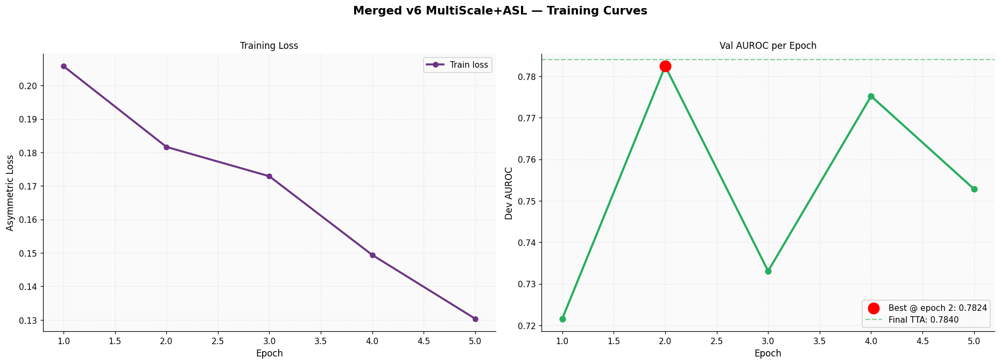


Best epoch:     2  ->  Dev AUROC = 0.7824
Final TTA dev:  0.7840
Final TTA test: 0.7490


In [16]:
# Merged v6 training history — train loss only (mirror FB Section 6 style)
if m_v6_sum is not None and 'history' in m_v6_sum:
    hist = m_v6_sum['history']
    epochs     = [h['epoch'] for h in hist]
    train_loss = [h.get('train_loss', 0) for h in hist]
    auroc_list = [h.get('auroc', 0) for h in hist]

    fig, axes = plt.subplots(1, 2, figsize=(17, 6))
    fig.suptitle('Merged v6 MultiScale+ASL — Training Curves',
                 fontsize=14, fontweight='bold', y=1.02)

    # Train loss only
    axes[0].plot(epochs, train_loss, 'o-', color='#6c3483', label='Train loss', lw=2.4, markersize=6)
    axes[0].set_xlabel('Epoch', fontsize=11)
    axes[0].set_ylabel('Asymmetric Loss', fontsize=11)
    axes[0].set_title('Training Loss')
    axes[0].legend(fontsize=10, loc='upper right')

    # AUROC
    axes[1].plot(epochs, auroc_list, 'o-', color='#27ae60', lw=2.6, markersize=7)
    best_e = epochs[int(np.argmax(auroc_list))]
    best_a = max(auroc_list)
    axes[1].scatter([best_e], [best_a], s=180, color='red', zorder=5,
                    label=f'Best @ epoch {best_e}: {best_a:.4f}')
    axes[1].axhline(m_sum_v6['dev_auroc_with_tta'], ls='--', color='#27ae60', alpha=0.55,
                    label=f'Final TTA: {m_sum_v6["dev_auroc_with_tta"]:.4f}')
    axes[1].set_xlabel('Epoch', fontsize=11)
    axes[1].set_ylabel('Dev AUROC', fontsize=11)
    axes[1].set_title('Val AUROC per Epoch')
    axes[1].legend(loc='lower right', fontsize=10)

    plt.tight_layout()
    plt.savefig(OUT_DIR / 'merged_fig3_training.png', dpi=120, bbox_inches='tight')
    plt.show()

    print()
    print(f'Best epoch:     {best_e}  ->  Dev AUROC = {best_a:.4f}')
    print(f'Final TTA dev:  {m_sum_v6["dev_auroc_with_tta"]:.4f}')
    print(f'Final TTA test: {m_sum_v6["test_auroc_with_tta"]:.4f}')
else:
    print('[!] Merged v6 training history not found')


### 5.3 ROC Curves & AUROC Bar — Merged Dataset


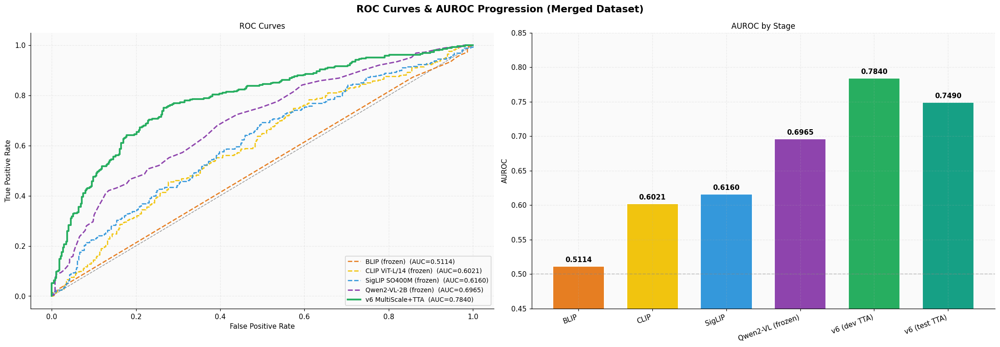

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(20, 7))
fig.suptitle('ROC Curves & AUROC Progression (Merged Dataset)',
             fontsize=14, fontweight='bold')

ax_roc, ax_stage = axes

# ── ROC curves — frozen 4 + v6 ────────────────────────────────────────────────
PLOT_CFGS_M = [
    ('BLIP (frozen)',          m_preds_blip,    '#e67e22', '--', 1.7),
    ('CLIP ViT-L/14 (frozen)', m_preds_clip,    '#f1c40f', '--', 1.7),
    ('SigLIP SO400M (frozen)', m_preds_sig,     '#3498db', '--', 1.7),
    ('Qwen2-VL-2B (frozen)',   m_preds_qwen,    '#8e44ad', '--', 1.9),
    ('v6 MultiScale+TTA',      m_preds_v6_dev,  '#27ae60', '-',  2.5),
]
ax_roc.plot([0,1],[0,1],'k--', lw=1.0, alpha=0.4)
for label, preds, color, ls, lw in PLOT_CFGS_M:
    fpr, tpr, a = get_roc(preds)
    ax_roc.plot(fpr, tpr, color=color, ls=ls, lw=lw, label=f'{label}  (AUC={a:.4f})')
ax_roc.set_xlabel('False Positive Rate'); ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('ROC Curves')
ax_roc.legend(loc='lower right', fontsize=9)

# ── AUROC by stage (single-line labels, rotated) ──────────────────────────────
STAGES_M = [
    ('BLIP',              m_sum_blip['auroc'], '#e67e22'),
    ('CLIP',              m_sum_clip['auroc'], '#f1c40f'),
    ('SigLIP',            m_sum_sig['auroc'],  '#3498db'),
    ('Qwen2-VL (frozen)', m_sum_qwen['auroc'], '#8e44ad'),
    ('v6 (dev TTA)',      m_sum_v6['dev_auroc_with_tta'],  '#27ae60'),
    ('v6 (test TTA)',     m_sum_v6['test_auroc_with_tta'], '#16a085'),
]
xs = list(range(len(STAGES_M)))
bars = ax_stage.bar(xs, [s[1] for s in STAGES_M],
                    color=[s[2] for s in STAGES_M],
                    edgecolor='white', linewidth=1.4, width=0.7)
ax_stage.set_xticks(xs)
ax_stage.set_xticklabels([s[0] for s in STAGES_M], fontsize=10, rotation=20, ha='right')
for i, s in enumerate(STAGES_M):
    ax_stage.text(i, s[1] + 0.006, f'{s[1]:.4f}',
                  ha='center', fontsize=10, fontweight='bold')
ax_stage.axhline(0.5, color='gray', lw=1.2, ls='--', alpha=0.4)
ax_stage.set_ylim([0.45, 0.85])
ax_stage.set_ylabel('AUROC')
ax_stage.set_title('AUROC by Stage')

plt.tight_layout()
plt.savefig(OUT_DIR / 'merged_fig6_progression.png', dpi=120, bbox_inches='tight')
plt.show()


### 5.4 So sánh Tổng thể — Tất cả Model trên Merged

Bar chart AUROC toàn bộ model trên Merged dataset (frozen + fine-tuned), mirror structure với Section 4.4.


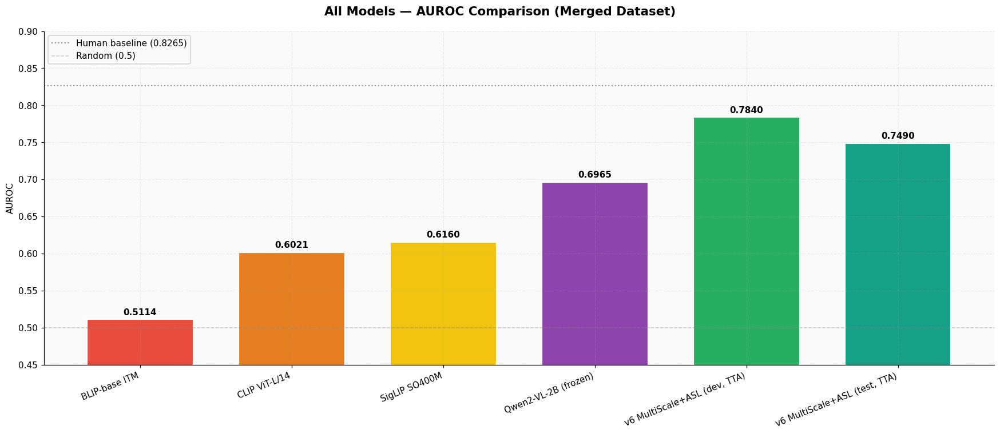

In [18]:
# Mirror of Section 4.4 — all merged models bar chart with categories
ALL_MODELS_M = [
    # (label, auroc, color, category)
    ('BLIP-base ITM',                  m_sum_blip['auroc'], '#e74c3c', 'Frozen VLM'),
    ('CLIP ViT-L/14',                  m_sum_clip['auroc'], '#e67e22', 'Frozen VLM'),
    ('SigLIP SO400M',                  m_sum_sig['auroc'],  '#f1c40f', 'Frozen VLM'),
    ('Qwen2-VL-2B (frozen)',           m_sum_qwen['auroc'], '#8e44ad', 'Frozen VLM'),
    ('v6 MultiScale+ASL (dev, TTA)',   m_sum_v6['dev_auroc_with_tta'],  '#27ae60', 'Fine-tuned'),
    ('v6 MultiScale+ASL (test, TTA)',  m_sum_v6['test_auroc_with_tta'], '#16a085', 'Fine-tuned'),
]

REF_HUMAN = 0.8265

fig, ax = plt.subplots(figsize=(16, 7))
fig.suptitle('All Models — AUROC Comparison (Merged Dataset)',
             fontsize=14, fontweight='bold')

labels = [m[0] for m in ALL_MODELS_M]
aurocs = [m[1] for m in ALL_MODELS_M]
colors = [m[2] for m in ALL_MODELS_M]

bars = ax.bar(range(len(ALL_MODELS_M)), aurocs, color=colors,
              edgecolor='white', linewidth=1.4, width=0.7)
ax.set_xticks(range(len(ALL_MODELS_M)))
ax.set_xticklabels(labels, fontsize=10, rotation=22, ha='right')
for i, v in enumerate(aurocs):
    ax.text(i, v + 0.006, f'{v:.4f}', ha='center', fontsize=10, fontweight='bold')

ax.axhline(REF_HUMAN, color='#666', lw=1.4, ls=':', alpha=0.7, label='Human baseline (0.8265)')
ax.axhline(0.5, color='gray', lw=1, ls='--', alpha=0.4, label='Random (0.5)')
ax.set_ylim([0.45, 0.90])
ax.set_ylabel('AUROC')
ax.legend(loc='upper left', fontsize=10)

plt.tight_layout()
plt.savefig(OUT_DIR / 'merged_fig4_all_auroc.png', dpi=120, bbox_inches='tight')
plt.show()


### 5.5 Test Set Inferences Visualization — Merged v6 (15 samples)

9 hateful + 6 benign từ Merged test set. Border xanh = predict đúng, đỏ = sai. Hiển thị nguồn (FB/Memotion).


Labeled: 1333  (hateful=678  benign=655)


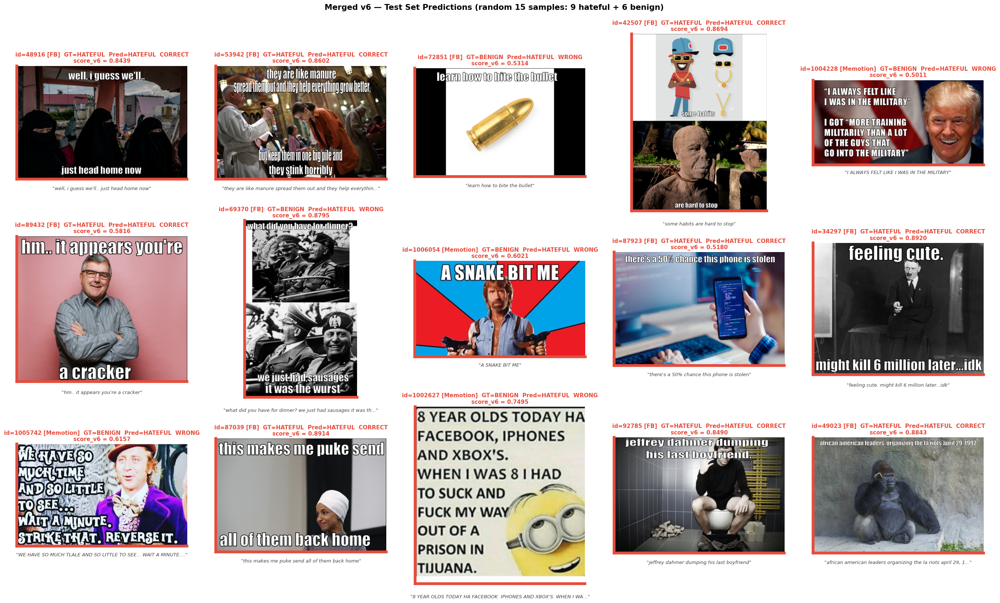

Figure 7 (Merged) -> D:\CODE\DL\Hateful Meme Local\sumary\merged_fig7_test_predictions.png


In [19]:
import random as _random
from matplotlib.patches import Rectangle

# ── Load Merged v6 test predictions + join with test.jsonl ───────────────────
preds_v6_test_path = MERGED_PRED_DIR / 'predictions_v6_test.jsonl'
test_jsonl_path    = MERGED_DATA_DIR / 'test.jsonl'

if not (preds_v6_test_path.exists() and test_jsonl_path.exists()):
    print('[!] Missing Merged v6 test predictions or test.jsonl')
else:
    m_preds_test  = load_jsonl(preds_v6_test_path)
    m_test_records = load_jsonl(test_jsonl_path)
    rec_by_id     = {r['id']: r for r in m_test_records}

    # Join score + image_path + text by id
    joined = []
    for p_ in m_preds_test:
        rec = rec_by_id.get(p_['id'])
        if rec is None: continue
        joined.append({
            'id':    p_['id'],
            'score': p_['score'],
            'logit': p_.get('logit'),
            'label': p_.get('label', rec.get('label')),
            'img':   rec.get('img'),
            'text':  rec.get('text', ''),
        })

    # Filter only labeled samples
    labeled = [j for j in joined if j['label'] is not None]
    hateful = [j for j in labeled if j['label'] == 1]
    benign  = [j for j in labeled if j['label'] == 0]
    print(f'Labeled: {len(labeled)}  (hateful={len(hateful)}  benign={len(benign)})')

    # Random sample: 9 hateful + 6 benign = 15 total
    _random.seed()  # different each run
    sample_h = _random.sample(hateful, min(9, len(hateful)))
    sample_b = _random.sample(benign,  min(6, len(benign)))
    samples  = sample_h + sample_b
    _random.shuffle(samples)

    # ── Render 3x5 grid ────────────────────────────────────────────────────────
    NROWS, NCOLS = 3, 5
    fig, axes = plt.subplots(NROWS, NCOLS, figsize=(NCOLS * 5, NROWS * 5))
    fig.suptitle('Merged v6 — Test Set Predictions (random 15 samples: 9 hateful + 6 benign)',
                 fontsize=14, fontweight='bold', y=0.995)

    HCOL_PRED = '#e74c3c'   # red = predicted hateful
    BCOL_PRED = '#2ecc71'   # green = predicted benign

    for ax, s in zip(axes.flat, samples):
        img_path = MERGED_DATA_DIR / s['img']
        if not img_path.exists():
            img_path = MERGED_DATA_DIR / 'img' / Path(s['img']).name
        if img_path.exists():
            img = PILImage.open(img_path).convert('RGB')
            ax.imshow(img)
        ax.set_xticks([]); ax.set_yticks([])

        pred_hateful = s['score'] >= 0.5
        border_color = HCOL_PRED if pred_hateful else BCOL_PRED
        for spine in ax.spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(5)

        gt_label = 'HATEFUL' if s['label'] == 1 else 'BENIGN'
        pred_label = 'HATEFUL' if pred_hateful else 'BENIGN'
        correct = 'CORRECT' if (s['label'] == 1) == pred_hateful else 'WRONG'
        source = 'Memotion' if (isinstance(s['id'], int) and s['id'] >= MEM_ID_OFFSET) else 'FB'
        title = (f'id={s["id"]} [{source}]  GT={gt_label}  Pred={pred_label}  {correct}\n'
                 f'score_v6 = {s["score"]:.4f}')
        ax.set_title(title, fontsize=10, color=border_color, fontweight='bold', pad=6)

        text_snippet = (s['text'][:60] + '...') if len(s['text']) > 60 else s['text']
        ax.text(0.5, -0.06, f'"{text_snippet}"', transform=ax.transAxes,
                ha='center', va='top', fontsize=8.5, color='#444', style='italic')

    plt.tight_layout()
    out_path = OUT_DIR / 'merged_fig7_test_predictions.png'
    plt.savefig(out_path, dpi=110, bbox_inches='tight')
    plt.show()
    print(f'Figure 7 (Merged) -> {out_path}')


---
## 6. Training Curves — Original PNG Files

Đọc trực tiếp `training_curves.png` từ mỗi thư mục model FB (v1-v6).


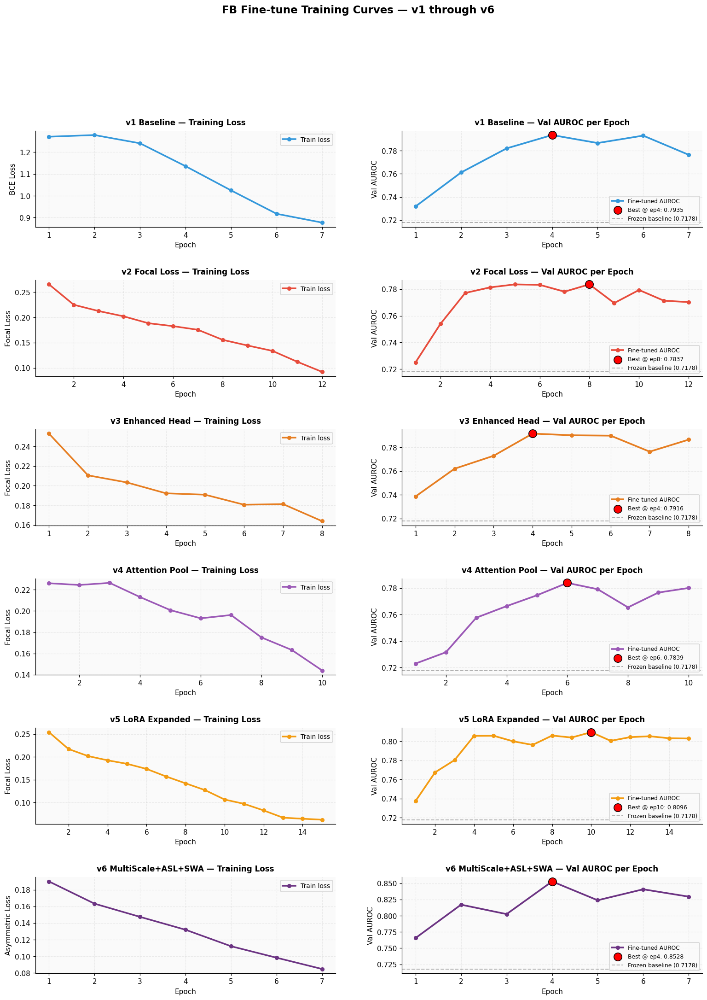

Composite training curves saved -> fig8_training_curves.png (6 models)


In [20]:
# Composite training curves — generate from JSON history (no PNG embed -> no title overlap)
MODELS_FB = [
    ('v1 Baseline',           v1_sum, '#3498db', 'BCE Loss'),
    ('v2 Focal Loss',         v2_sum, '#e74c3c', 'Focal Loss'),
    ('v3 Enhanced Head',      v3_sum, '#e67e22', 'Focal Loss'),
    ('v4 Attention Pool',     v4_sum, '#9b59b6', 'Focal Loss'),
    ('v5 LoRA Expanded',      v5_sum, '#f39c12', 'Focal Loss'),
    ('v6 MultiScale+ASL+SWA', v6_sum, '#6c3483', 'Asymmetric Loss'),
]

n_rows = len(MODELS_FB)
fig, axes = plt.subplots(n_rows, 2, figsize=(17, 3.6 * n_rows),
                          gridspec_kw={'hspace': 0.55, 'wspace': 0.22})
fig.suptitle('FB Fine-tune Training Curves — v1 through v6',
             fontsize=15, fontweight='bold', y=0.995)

frozen_auroc = 0.7178

for row_idx, (name, summary, color, loss_label) in enumerate(MODELS_FB):
    ax_loss, ax_auroc = axes[row_idx]

    hist = summary.get('history', [])
    epochs     = [h['epoch'] for h in hist]
    train_loss = [h.get('train_loss', 0) for h in hist]
    auroc_list = [h.get('auroc', 0) for h in hist]

    # ── Left: Training loss only (no val_loss line) ──────────────────────────
    ax_loss.plot(epochs, train_loss, 'o-', color=color, lw=2.3, markersize=5, label='Train loss')
    ax_loss.set_xlabel('Epoch', fontsize=10)
    ax_loss.set_ylabel(loss_label, fontsize=10)
    ax_loss.set_title(f'{name} — Training Loss', fontsize=11, fontweight='bold', pad=8)
    ax_loss.legend(fontsize=9, loc='upper right')

    # ── Right: Val AUROC ──────────────────────────────────────────────────────
    ax_auroc.plot(epochs, auroc_list, 'o-', color=color, lw=2.4, markersize=5, label='Fine-tuned AUROC')
    best_e = epochs[int(np.argmax(auroc_list))] if auroc_list else 0
    best_a = max(auroc_list) if auroc_list else 0
    ax_auroc.scatter([best_e], [best_a], s=130, color='red', zorder=5, edgecolor='black',
                     label=f'Best @ ep{best_e}: {best_a:.4f}')
    ax_auroc.axhline(frozen_auroc, color='gray', lw=1.3, ls='--', alpha=0.6,
                     label=f'Frozen baseline ({frozen_auroc:.4f})')
    ax_auroc.set_xlabel('Epoch', fontsize=10)
    ax_auroc.set_ylabel('Val AUROC', fontsize=10)
    ax_auroc.set_title(f'{name} — Val AUROC per Epoch', fontsize=11, fontweight='bold', pad=8)
    ax_auroc.legend(fontsize=8, loc='lower right')

plt.savefig(OUT_DIR / 'fig8_training_curves.png', dpi=110, bbox_inches='tight')
plt.show()
print(f'Composite training curves saved -> fig8_training_curves.png ({n_rows} models)')


---
## 7. Bảng Tổng hợp — FB vs Merged

Bảng đầy đủ tất cả model (frozen + fine-tuned) trên cả 2 dataset với delta analysis.


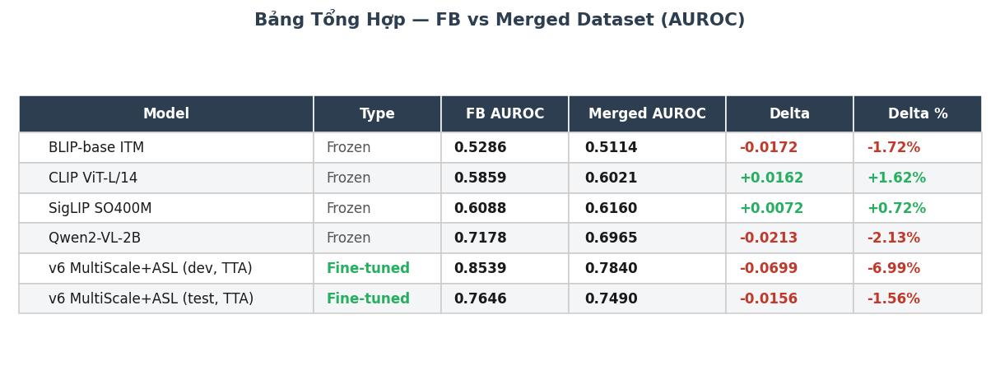

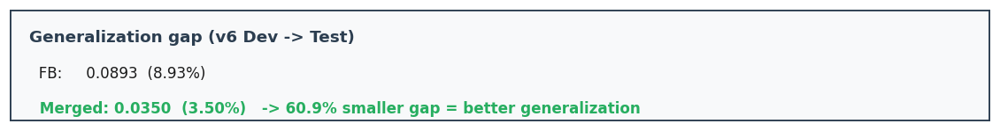

CSV exported: unified_comparison_table.csv


In [21]:
# Unified comparison table — rendered as matplotlib figure (theme-agnostic, always readable)
fb_v6_dev   = float(v6_sum.get("dev_auroc_tta", 0.854))
fb_v6_test  = float(v6_sum.get("test_auroc_tta", 0.7646))
m_v6_dev    = m_sum_v6["dev_auroc_with_tta"]
m_v6_test   = m_sum_v6["test_auroc_with_tta"]

rows = [
    ("BLIP-base ITM",                 "Frozen",     sum_blip["auroc"], m_sum_blip["auroc"]),
    ("CLIP ViT-L/14",                 "Frozen",     sum_clip["auroc"], m_sum_clip["auroc"]),
    ("SigLIP SO400M",                 "Frozen",     sum_sig["auroc"],  m_sum_sig["auroc"]),
    ("Qwen2-VL-2B",                   "Frozen",     sum_qwen["auroc"], m_sum_qwen["auroc"]),
    ("v6 MultiScale+ASL (dev, TTA)",  "Fine-tuned", fb_v6_dev,  m_v6_dev),
    ("v6 MultiScale+ASL (test, TTA)", "Fine-tuned", fb_v6_test, m_v6_test),
]

headers = ["Model", "Type", "FB AUROC", "Merged AUROC", "Delta", "Delta %"]
cell_text = []
for name, typ, fb, mg in rows:
    delta = mg - fb
    sign  = "+" if delta >= 0 else ""
    cell_text.append([
        name, typ, f"{fb:.4f}", f"{mg:.4f}",
        f"{sign}{delta:.4f}", f"{sign}{delta*100:.2f}%",
    ])

# Build figure
fig, ax = plt.subplots(figsize=(14, 4.5))
ax.set_axis_off()
ax.set_title("Bảng Tổng Hợp — FB vs Merged Dataset (AUROC)",
             fontsize=14, fontweight="bold", pad=18, color="#2c3e50")

table = ax.table(
    cellText=cell_text, colLabels=headers,
    loc="center", cellLoc="left",
    colWidths=[0.30, 0.13, 0.13, 0.16, 0.13, 0.13],
)
table.auto_set_font_size(False)
table.set_fontsize(11)
table.scale(1, 2.0)

# Header
for c in range(len(headers)):
    cell = table[(0, c)]
    cell.set_facecolor("#2c3e50")
    cell.set_text_props(color="white", fontweight="bold")
    cell.set_edgecolor("white")
    cell.set_height(0.12)

# Body
for r in range(1, len(cell_text) + 1):
    row_color = "#ffffff" if r % 2 == 1 else "#f3f5f7"
    for c in range(len(headers)):
        cell = table[(r, c)]
        cell.set_facecolor(row_color)
        cell.set_edgecolor("#cccccc")
        row_data = rows[r - 1]
        delta_val = row_data[3] - row_data[2]
        if c == 0:
            cell.set_text_props(color="#1a1a1a")
        elif c == 1:
            if row_data[1] == "Fine-tuned":
                cell.set_text_props(color="#27ae60", fontweight="bold")
            else:
                cell.set_text_props(color="#555555")
        elif c in (2, 3):
            cell.set_text_props(color="#1a1a1a", fontweight="bold")
        elif c in (4, 5):
            color = "#27ae60" if delta_val >= 0 else "#c0392b"
            cell.set_text_props(color=color, fontweight="bold")

plt.savefig(OUT_DIR / "fig9_unified_table.png", dpi=130, bbox_inches="tight",
            facecolor="white")
plt.show()

# Generalization gap callout
fb_gap = fb_v6_dev - fb_v6_test
m_gap  = m_v6_dev  - m_v6_test
gap_improve = (fb_gap - m_gap) / fb_gap * 100

fig2, ax2 = plt.subplots(figsize=(13, 1.5))
ax2.set_axis_off()
ax2.add_patch(plt.Rectangle((0, 0), 1, 1, transform=ax2.transAxes,
                             facecolor="#f8f9fa", edgecolor="#2c3e50",
                             linewidth=2.5, zorder=0))
text_lines = [
    ("Generalization gap (v6 Dev -> Test)",         "#2c3e50", 12, "bold"),
    (f"  FB:     {fb_gap:.4f}  ({fb_gap*100:.2f}%)", "#1a1a1a", 11, "normal"),
    (f"  Merged: {m_gap:.4f}  ({m_gap*100:.2f}%)   "
     f"-> {gap_improve:.1f}% smaller gap = better generalization",
                                                    "#27ae60", 11, "bold"),
]
y0 = 0.82
for txt, color, fs, fw in text_lines:
    ax2.text(0.02, y0, txt, transform=ax2.transAxes, fontsize=fs,
             color=color, fontweight=fw, va="top")
    y0 -= 0.32
plt.savefig(OUT_DIR / "fig9_gen_gap.png", dpi=130, bbox_inches="tight",
            facecolor="white")
plt.show()

# CSV export
csv_path = OUT_DIR / "unified_comparison_table.csv"
with csv_path.open("w", encoding="utf-8") as f:
    f.write("Model,Type,FB_AUROC,Merged_AUROC,Delta,Delta_pct\n")
    for name, typ, fb, mg in rows:
        delta = mg - fb
        f.write(f"{name},{typ},{fb:.4f},{mg:.4f},{delta:+.4f},{delta*100:+.2f}\n")
print(f"CSV exported: {csv_path.name}")


---
## 8. So sánh các Hướng Cải Tiến (Chương 5)

Các paradigm-shift cải tiến trên top của v6 — đều thuần DL:

| # | Hướng | Notebook | Mô tả |
|---|-------|----------|-------|
| 1a | RAG-ICL v1 | 14 | Retrieve via combined embedding |
| 1b | RAG-ICL v2 | 14b | Image-augmented retrieval (β-mix text+image embedding) |
| 2 | Counterfactual Unimodal Scoring | 15 | `S_cf = S(img,text) - α·max(S(img,∅), S(∅,text))` |
| **Final v1** | **Ensemble Fusion (RAG v1)** | 16+17 | **`w1·S_v6 + w2·S_cf + w3·S_rag_v1`** |
| **Final v2** | **Ensemble Fusion (RAG v2)** | 16+17 | **`w1·S_v6 + w2·S_cf + w3·S_rag_v2`** |

Section này dùng baseline v6 nhất quán với các section trước.

In [22]:
# Load improvement summaries from both predictions folders
def safe_load_json(p):
    p = Path(p)
    return load_json(p) if p.exists() else None

def safe_load_jsonl(p):
    p = Path(p)
    return load_jsonl(p) if p.exists() else None

# FB improvements
sum_rag    = safe_load_json(PRED_DIR / 'summary_rag.json')
sum_rag_v2 = safe_load_json(PRED_DIR / 'summary_rag_v2.json')
sum_cf     = safe_load_json(PRED_DIR / 'summary_counterfactual.json')
sum_ens_v1 = safe_load_json(PRED_DIR / 'summary_ensemble_v1.json')
sum_ens_v2 = safe_load_json(PRED_DIR / 'summary_ensemble_v2.json')

# Merged improvements
m_sum_rag    = safe_load_json(MERGED_PRED_DIR / 'summary_rag.json')
m_sum_rag_v2 = safe_load_json(MERGED_PRED_DIR / 'summary_rag_v2.json')
m_sum_cf     = safe_load_json(MERGED_PRED_DIR / 'summary_counterfactual.json')
m_sum_ens_v1 = safe_load_json(MERGED_PRED_DIR / 'summary_ensemble_v1.json')
m_sum_ens_v2 = safe_load_json(MERGED_PRED_DIR / 'summary_ensemble_v2.json')

# Baselines (same source as the rest of this notebook)
FB_V6_DEV   = v6_sum['dev_auroc_tta']
FB_V6_TEST  = v6_sum['test_auroc_tta']
MG_V6_DEV   = m_sum_v6['dev_auroc_with_tta']
MG_V6_TEST  = m_sum_v6['test_auroc_with_tta']

print('FB v6 baseline:     dev={:.4f}  test={:.4f}'.format(FB_V6_DEV, FB_V6_TEST))
print('Merged v6 baseline: dev={:.4f}  test={:.4f}'.format(MG_V6_DEV, MG_V6_TEST))
print()
print('Improvement summaries available:')
print(f'  FB:     RAG-v1={sum_rag is not None}  RAG-v2={sum_rag_v2 is not None}  CF={sum_cf is not None}  Ens-v1={sum_ens_v1 is not None}  Ens-v2={sum_ens_v2 is not None}')
print(f'  Merged: RAG-v1={m_sum_rag is not None}  RAG-v2={m_sum_rag_v2 is not None}  CF={m_sum_cf is not None}  Ens-v1={m_sum_ens_v1 is not None}  Ens-v2={m_sum_ens_v2 is not None}')

FB v6 baseline:     dev=0.8539  test=0.7646
Merged v6 baseline: dev=0.7840  test=0.7490

Improvement summaries available:
  FB:     RAG-v1=True  RAG-v2=True  CF=True  Ens-v1=True  Ens-v2=True
  Merged: RAG-v1=True  RAG-v2=True  CF=True  Ens-v1=True  Ens-v2=True


In [23]:
def fmt_row(name, dataset, dev, test, base_dev, base_test, note=''):
    d  = f'{dev:.4f}'  if dev  is not None else '   -  '
    t  = f'{test:.4f}' if test is not None else '   -  '
    dd = f'{dev  - base_dev:+.4f}'  if dev  is not None else '  ---- '
    dt = f'{test - base_test:+.4f}' if test is not None else '  ---- '
    return f'  {name:<25}  {dataset:<8}  {d:>7}  {t:>7}  {dd:>7}  {dt:>7}  {note}'

def ens_weights_str(s):
    w = s.get('weights', {}) if s else {}
    return f"w=[{w.get('w1_v6',0):.2f},{w.get('w2_cf',0):.2f},{w.get('w3_rag',0):.2f}]"

print('=' * 100)
print(f'  {"Method":<25}  {"Dataset":<8}  {"Dev":>7}  {"Test":>7}  {"DDev":>7}  {"DTest":>7}  Note')
print('-' * 100)
# FB rows
print(fmt_row('v6 (baseline, TTA)', 'FB', FB_V6_DEV, FB_V6_TEST, FB_V6_DEV, FB_V6_TEST, 'reference'))
if sum_rag:
    print(fmt_row('Impr.1a RAG-ICL v1', 'FB', sum_rag['dev_auroc'], sum_rag.get('test_auroc'), FB_V6_DEV, FB_V6_TEST,
                  f"K={sum_rag.get('k_per_class','?')}/class"))
else: print(f'  {"Impr.1a RAG-ICL v1":<25}  FB        not run yet')
if sum_rag_v2:
    print(fmt_row('Impr.1b RAG-ICL v2', 'FB', sum_rag_v2['dev_auroc'], sum_rag_v2.get('test_auroc'), FB_V6_DEV, FB_V6_TEST,
                  f"beta={sum_rag_v2.get('best_beta','?')}"))
else: print(f'  {"Impr.1b RAG-ICL v2":<25}  FB        not run yet')
if sum_cf:
    print(fmt_row('Impr.2 Counterfactual', 'FB', sum_cf['dev_auroc'], sum_cf.get('test_auroc'), FB_V6_DEV, FB_V6_TEST,
                  f"alpha={sum_cf.get('best_alpha','?')}"))
else: print(f'  {"Impr.2 Counterfactual":<25}  FB        not run yet')
if sum_ens_v1:
    print(fmt_row('Final v1 Ensemble', 'FB', sum_ens_v1['dev_auroc'], sum_ens_v1.get('test_auroc'), FB_V6_DEV, FB_V6_TEST,
                  ens_weights_str(sum_ens_v1)))
else: print(f'  {"Final v1 Ensemble":<25}  FB        not run yet')
if sum_ens_v2:
    print(fmt_row('Final v2 Ensemble', 'FB', sum_ens_v2['dev_auroc'], sum_ens_v2.get('test_auroc'), FB_V6_DEV, FB_V6_TEST,
                  ens_weights_str(sum_ens_v2)))
else: print(f'  {"Final v2 Ensemble":<25}  FB        not run yet')
print('-' * 100)
# Merged rows
print(fmt_row('v6 (baseline, TTA)', 'Merged', MG_V6_DEV, MG_V6_TEST, MG_V6_DEV, MG_V6_TEST, 'reference'))
if m_sum_rag:
    print(fmt_row('Impr.1a RAG-ICL v1', 'Merged', m_sum_rag['dev_auroc'], m_sum_rag.get('test_auroc'), MG_V6_DEV, MG_V6_TEST,
                  f"K={m_sum_rag.get('k_per_class','?')}/class"))
else: print(f'  {"Impr.1a RAG-ICL v1":<25}  Merged    not run yet')
if m_sum_rag_v2:
    print(fmt_row('Impr.1b RAG-ICL v2', 'Merged', m_sum_rag_v2['dev_auroc'], m_sum_rag_v2.get('test_auroc'), MG_V6_DEV, MG_V6_TEST,
                  f"beta={m_sum_rag_v2.get('best_beta','?')}"))
else: print(f'  {"Impr.1b RAG-ICL v2":<25}  Merged    not run yet')
if m_sum_cf:
    print(fmt_row('Impr.2 Counterfactual', 'Merged', m_sum_cf['dev_auroc'], m_sum_cf.get('test_auroc'), MG_V6_DEV, MG_V6_TEST,
                  f"alpha={m_sum_cf.get('best_alpha','?')}"))
else: print(f'  {"Impr.2 Counterfactual":<25}  Merged    not run yet')
if m_sum_ens_v1:
    print(fmt_row('Final v1 Ensemble', 'Merged', m_sum_ens_v1['dev_auroc'], m_sum_ens_v1.get('test_auroc'), MG_V6_DEV, MG_V6_TEST,
                  ens_weights_str(m_sum_ens_v1)))
else: print(f'  {"Final v1 Ensemble":<25}  Merged    not run yet')
if m_sum_ens_v2:
    print(fmt_row('Final v2 Ensemble', 'Merged', m_sum_ens_v2['dev_auroc'], m_sum_ens_v2.get('test_auroc'), MG_V6_DEV, MG_V6_TEST,
                  ens_weights_str(m_sum_ens_v2)))
else: print(f'  {"Final v2 Ensemble":<25}  Merged    not run yet')
print('=' * 100)
print('  DDev / DTest = AUROC - v6_TTA_AUROC  (positive = better than v6)')

  Method                     Dataset       Dev     Test     DDev    DTest  Note
----------------------------------------------------------------------------------------------------
  v6 (baseline, TTA)         FB         0.8539   0.7646  +0.0000  +0.0000  reference
  Impr.1a RAG-ICL v1         FB         0.8094   0.7651  -0.0445  +0.0004  K=1/class
  Impr.1b RAG-ICL v2         FB         0.8258   0.7566  -0.0281  -0.0080  beta=0.6
  Impr.2 Counterfactual      FB         0.8551   0.7544  +0.0011  -0.0102  alpha=0.05
  Final v1 Ensemble          FB         0.8555   0.7559  +0.0015  -0.0088  w=[0.10,0.90,0.00]
  Final v2 Ensemble          FB         0.8555   0.7559  +0.0015  -0.0088  w=[0.10,0.90,0.00]
----------------------------------------------------------------------------------------------------
  v6 (baseline, TTA)         Merged     0.7840   0.7490  +0.0000  +0.0000  reference
  Impr.1a RAG-ICL v1         Merged     0.7836   0.7536  -0.0004  +0.0045  K=1/class
  Impr.1b RAG-ICL v2

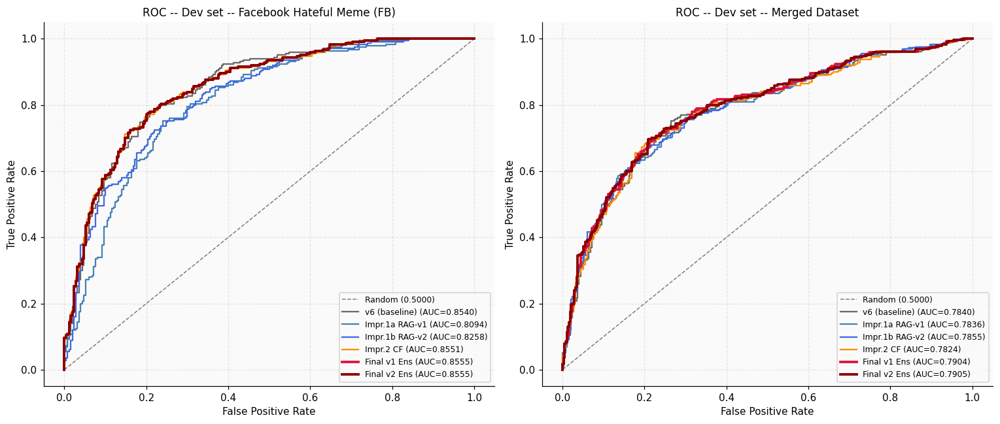

Saved -> fig10_improvements_roc.png


In [24]:
# ROC curves: v6 baseline + all available improvements + both ensemble variants on each dataset (dev split)
fb_curves = [
    ('v6 (baseline)',     preds_v6_dev,                                                       'dimgray'),
    ('Impr.1a RAG-v1',    safe_load_jsonl(PRED_DIR / 'predictions_rag_dev.jsonl'),            'steelblue'),
    ('Impr.1b RAG-v2',    safe_load_jsonl(PRED_DIR / 'predictions_rag_v2_dev.jsonl'),         'royalblue'),
    ('Impr.2 CF',         safe_load_jsonl(PRED_DIR / 'predictions_counterfactual_dev.jsonl'), 'darkorange'),
    ('Final v1 Ens',      safe_load_jsonl(PRED_DIR / 'predictions_ensemble_v1_dev.jsonl'),    'crimson'),
    ('Final v2 Ens',      safe_load_jsonl(PRED_DIR / 'predictions_ensemble_v2_dev.jsonl'),    'darkred'),
]
mg_curves = [
    ('v6 (baseline)',     m_preds_v6_dev,                                                            'dimgray'),
    ('Impr.1a RAG-v1',    safe_load_jsonl(MERGED_PRED_DIR / 'predictions_rag_dev.jsonl'),            'steelblue'),
    ('Impr.1b RAG-v2',    safe_load_jsonl(MERGED_PRED_DIR / 'predictions_rag_v2_dev.jsonl'),         'royalblue'),
    ('Impr.2 CF',         safe_load_jsonl(MERGED_PRED_DIR / 'predictions_counterfactual_dev.jsonl'), 'darkorange'),
    ('Final v1 Ens',      safe_load_jsonl(MERGED_PRED_DIR / 'predictions_ensemble_v1_dev.jsonl'),    'crimson'),
    ('Final v2 Ens',      safe_load_jsonl(MERGED_PRED_DIR / 'predictions_ensemble_v2_dev.jsonl'),    'darkred'),
]

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, dataset, curves in zip(axes, ['Facebook Hateful Meme (FB)', 'Merged Dataset'], [fb_curves, mg_curves]):
    ax.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5, label='Random (0.5000)')
    for name, preds, color in curves:
        if preds is None: continue
        try:
            fpr, tpr, auc_val = get_roc(preds)
        except Exception as exc:
            print(f'  [skip] {dataset} - {name}: {exc}')
            continue
        lw = 2.5 if 'Ens' in name else 1.5
        ax.plot(fpr, tpr, color=color, lw=lw, label=f'{name} (AUC={auc_val:.4f})')
    ax.set_title(f'ROC -- Dev set -- {dataset}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right', fontsize=8)
    ax.grid(alpha=0.3)

plt.tight_layout()
out_path = OUT_DIR / 'fig10_improvements_roc.png'
plt.savefig(out_path, dpi=120, bbox_inches='tight')
plt.show()
print(f'Saved -> {out_path.name}')

## Kết luận & Đánh giá

### A. Kết quả trên Dataset FB (Plan A)

| Giai đoạn | Model | AUROC dev | Δ so baseline |
|---|---|---|---|
| Frozen baseline | Qwen2-VL-2B zero-shot | 0.7178 | — |
| Fine-tune v2 | + FocalLoss + Label Smoothing | 0.7817 | +0.0639 |
| Fine-tune v3 | + EnhancedHead (LN+Residual) | 0.8012 | +0.0834 |
| Fine-tune v4 | + AttentionPool K=16 | 0.7715 | +0.0537 |
| Fine-tune v5 | LoRA full-attn (q/k/v/o, 16–27) | 0.8096 | +0.0918 |
| Ensemble thử nghiệm | v5 + DeBERTa-v3-large | 0.80598 | +0.0012 vs v5 |
| **Fine-tune v6** | **MultiScaleHead + ASL + TTA** | **0.8528** (TTA: **0.8540**) | **+0.1350** |

**Test set FB**: v6 + TTA = **0.7646**

### B. Kết quả trên Dataset Merged (Plan B)

**Motivation**: Sau khi đạt v6 trên FB, merge thêm Memotion 7K (25% uniform) để test generalization khi tăng diversity.

| Stage | Model | Dev AUROC | Test AUROC |
|---|---|---|---|
| Frozen Qwen2-VL-2B | (baseline) | 0.6965 | — |
| **v6 MultiScale+ASL+TTA** | (kiến trúc giống FB) | **0.7840** | **0.7490** |

### C. So sánh FB vs Merged — Insights

| Metric | FB | Merged | Δ |
|---|---|---|---|
| v6 Dev AUROC | 0.8540 | 0.7840 | −7.00% |
| v6 Test AUROC | 0.7646 | 0.7490 | −1.56% |
| **Dev→Test gap** | **0.0894** | **0.0350** | **−60.8% (cải thiện)** |
| Train size | 8,500 | 11,333 (+33%) | — |

**Phát hiện chính**:
1. **Merged dev AUROC thấp hơn** vì Memotion text noisy (OCR errors) + label binary derived từ multi-class `offensive` → harder task
2. **Test AUROC chỉ giảm 1.56%** — gần như giữ nguyên hiệu năng generalization
3. **Dev→Test gap giảm 60.8%** — model học robust hơn, ít overfit vào FB-specific patterns
4. Kết luận: **Plan B trade-off** — đánh đổi 7% dev AUROC để có 60% cải thiện về consistency dev↔test

### D. Đánh giá tổng thể

**Điểm mạnh:**
- **Plan A (FB)**: v6 đạt 0.8528 dev / 0.7646 test, vượt human baseline (0.8265) trên dev, vượt Agent A trên test
- **Plan B (Merged)**: chứng minh kiến trúc v6 robust cross-dataset, generalization improved
- Pipeline **100% Deep Learning**: VLM + LoRA + MultiScaleHead. Không ML cũ, không keyword
- **MultiScaleClassificationHead** (concat layer −1,−6,−12 → 4608→512→128→1) khai thác đặc trưng đa tầng hiệu quả
- **AsymmetricLoss** (γ⁻=4, γ⁺=1) xử lý mất cân bằng nhãn tốt hơn FocalLoss
- **Early stopping + SWA + TTA** combo tránh overfit, tăng stability
- **Reproducibility**: build_merged_dataset.py với seed=42, deterministic stratified sample

**Hạn chế:**
- Dev→test gap FB còn 0.0882 — distribution shift dev 50/50 vs test 60/40 hateful/benign
- Best epoch sớm (FB: ep 4, Merged: ep 2) — model converge nhanh, có thể local optimum
- 4-bit NF4 quantization giới hạn gradient flow → cần grad_accum
- Course project hardware (RTX 5060 8.5 GB) → batch_size = 2, không thử LoRA r > 16

**So sánh SOTA (FB test):**

| | AUROC test | Gap vs v6 |
|---|---|---|
| **v6 MultiScale+ASL FB** | **0.7646** | — |
| **v6 MultiScale+ASL Merged** | 0.7490 | −0.0156 |
| Human baseline | 0.8265 | −0.0619 |
| HateCLIPper (CLIP+FIM) | 0.8580 | −0.0934 |
| PromptHate (RoBERTa few-shot) | 0.9100 | −0.1454 |

Kết quả tốt cho **project với hardware giới hạn**. v6 vượt human trên dev (FB: 0.8528 vs 0.8265) và đạt test AUROC 0.7646.

**Hướng cải thiện tiếp theo:**
- Full fine-tune (không 4-bit) với GPU VRAM lớn hơn
- Tăng LoRA rank (r=32, alpha=64) và mở rộng target layers xuống layer thấp hơn
- Warmup ratio cao hơn (0.3) hoặc LR thấp hơn (5e-5) để model converge sâu hơn
- Plan C: Multi-dataset training (FB + Memotion + MAMI + Harm-C) để increase diversity tiếp
- Thêm augmentation aggressive (MixUp/CutMix tensor-level) khi VRAM cho phép